# Marker Annotation & YOLO Fine-Tuning

This notebook contains the following sections:
1. **Section 1** — Use SAM2 to track **lane rope markers** across video frames and export a YOLO-format labelled dataset.
2. **Section 2** — Fine-tune a YOLOv8 model to detect markers in any frame.

> **Goal:** Detect both lane rope markers → compute the lane-rope line.
>
> **Operational Requirement:**
> This workflow must be executed in a Unix-based environment or via WSL to ensure dependency compatibility.


## Section 0: Setup

In [1]:
# File operations
import os
import sys
import glob
import shutil
import json
import tempfile

# Numerical
import numpy as np
import pandas as pd
import random

# Image processing
import cv2

# Interactive display
import ipywidgets as widgets
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from IPython.display import display

# Object detection & tracking
import torch
import cv2
from sam2.build_sam import build_sam2_video_predictor
from ultralytics import YOLO

# Utilities
import contextlib

#### Necessary setup step: 
SAM2 is expecting individual frames. We must first convert from a mp4 video to a file containing the collection of individual frames. This may take a while depending on the length of the video, thus we only perform this step once.

In [2]:
# Define video folder path to read the video file
VIDEO_DIR = 'videos/under/'

# Video file name to read
FILENAME = 'Bottom_Freestyle_P034_1.MP4'

# Define the path to save the output video file
FRAMES_DIR = os.path.join('frames/under/', FILENAME.split('.')[0] + '/')

FORCE_REEXTRACT = False

# Check if the output folder exists, if not, create it & extract frames from the video file
if not os.path.exists(FRAMES_DIR) or FORCE_REEXTRACT:
    # create the output folder if it doesn't exist
    os.makedirs(FRAMES_DIR) if not os.path.exists(FRAMES_DIR) else None

    # extract frames from the video file
    os.system(
        f'ffmpeg -i {VIDEO_DIR}{FILENAME} -q:v 2 -start_number 0 {FRAMES_DIR}%05d.jpg')

    print(f'Frames extracted and saved to {FRAMES_DIR}')
else:
    print(
        f'Output folder {FRAMES_DIR} already exists. Skipping frame extraction.')

Output folder frames/under/Bottom_Freestyle_P034_1/ already exists. Skipping frame extraction.


#### Setting up cuda

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

if device.type == "cuda":
    print(f"GPU Name: {torch.cuda.get_device_name(0)}")
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True

Using device: cuda
GPU Name: NVIDIA GeForce RTX 5070 Ti


#### Setting up SAM2: 
Defining necessary paths

In [4]:
# Model paths and configs
CHECKPOINT = "SAM2/sam2/checkpoints/sam2.1_hiera_large.pt"
MODEL_CFG = "configs/sam2.1/sam2.1_hiera_l.yaml"   # relative to SAM2_ROOT

# YOLO dataset output folder
YOLO_DATASET_DIR = "yolo_dataset"

# Current video prefix for saving outputs
VIDEO_PREFIX = FILENAME.split('.')[0]

# Add SAM2 to path so its modules are importable
SAM2_ROOT = os.path.abspath("SAM2/sam2")
if SAM2_ROOT not in sys.path:
    sys.path.insert(0, SAM2_ROOT)

In [ ]:
%matplotlib widget

FORCE_REANNOTATION = False

# Load sorted frame paths
_frame_paths = sorted(
    glob.glob(os.path.join(FRAMES_DIR, "*.jpg")) +
    glob.glob(os.path.join(FRAMES_DIR, "*.jpeg")),
    key=lambda p: int(''.join(filter(str.isdigit, os.path.splitext(os.path.basename(p))[0])))
)
assert _frame_paths, f"No JPEG frames found in {FRAMES_DIR}"

_ANNOTATIONS_FILE = "annotations.json"

def _load_annotations():
    if os.path.exists(_ANNOTATIONS_FILE):
        with open(_ANNOTATIONS_FILE) as f:
            return json.load(f)
    return {}

_annotations = _load_annotations()
_saved = _annotations.get(FILENAME)

# Backward compatibility: old format stored a single "box", new stores "boxes" list
if _saved and "box" in _saved and "boxes" not in _saved:
    _saved["boxes"] = [_saved["box"]]

_BOX_COLORS = {0: 'lime'}  # class 0 = marker
_CLASS_NAMES = {0: 'Marker'}
_state = {"frame_idx": 0, "press": None, "boxes": [], "classes": []}  # classes[i] = 0

if _saved and not FORCE_REANNOTATION:
    _state["frame_idx"] = _saved["frame_idx"]
    _state["boxes"]     = _saved["boxes"]
    _state["classes"]   = _saved.get("classes", [0] * len(_saved["boxes"]))
    print(f"Loaded saved annotation for '{FILENAME}':")
    print(f"  frame_idx = {_saved['frame_idx']}")
    for i, (b, c) in enumerate(zip(_saved["boxes"], _state["classes"])):
        print(f"  box[{i}]    = {[round(v) for v in b]}  class={c} ({_CLASS_NAMES[c]})")
    print(f"\n{len(_saved['boxes'])} box(es) loaded. Run the next cell to confirm, or set FORCE_REANNOTATION = True to redo.")
else:
    fig, ax = plt.subplots(figsize=(12, 7))
    fig.canvas.header_visible = False  # type: ignore
    fig.tight_layout()

    def _load_rgb(idx):
        return cv2.cvtColor(cv2.imread(_frame_paths[idx]), cv2.COLOR_BGR2RGB)  # type: ignore

    _img_disp = ax.imshow(_load_rgb(0))
    _draft_rect = mpatches.Rectangle((0, 0), 0, 0, linewidth=2,
                                      edgecolor='white', facecolor='none', linestyle='--')
    ax.add_patch(_draft_rect)
    ax.set_axis_off()

    _permanent_artists = []  # list of (rect_patch, text_artist) per committed box

    def _update_title():
        n = len(_state["boxes"])
        mode = 'Marker'
        ax.set_title(
            f"Frame {_state['frame_idx']} — Drawing: {mode}. "
            f"Draw box {n + 1} (click & drag). {n} box(es) committed.",
            fontsize=10
        )
        fig.canvas.draw_idle()

    _update_title()

    _slider = widgets.IntSlider(
        value=0, min=0, max=len(_frame_paths) - 1, description='Frame:',
        continuous_update=False,
        style={'description_width': 'initial'},
        layout=widgets.Layout(width='80%')
    )
    _undo_btn = widgets.Button(description="Undo last box",
                               button_style='warning',
                               layout=widgets.Layout(width='150px'))

    def _redraw_permanent():
        for rect, txt in _permanent_artists:
            rect.remove()
            txt.remove()
        _permanent_artists.clear()
        for i, (box, cls) in enumerate(zip(_state["boxes"], _state["classes"])):
            color = _BOX_COLORS.get(cls, 'white')
            r = mpatches.Rectangle(
                (box[0], box[1]), box[2] - box[0], box[3] - box[1],
                linewidth=2, edgecolor=color, facecolor='none'
            )
            ax.add_patch(r)
            label = f"{_CLASS_NAMES.get(cls, str(cls))} {i + 1}"
            t = ax.text(box[0] + 4, box[1] + 14, label,
                        color=color, fontsize=9, fontweight='bold',
                        bbox=dict(facecolor='black', alpha=0.4, pad=1, edgecolor='none'))
            _permanent_artists.append((r, t))
        fig.canvas.draw_idle()

    def _on_frame_change(change):
        _state["frame_idx"] = change["new"]
        _img_disp.set_data(_load_rgb(_state["frame_idx"]))
        _update_title()

    def _on_undo(_):
        if _state["boxes"]:
            _state["boxes"].pop()
            _state["classes"].pop()
            _redraw_permanent()
            _update_title()

    _slider.observe(_on_frame_change, names='value')
    _undo_btn.on_click(_on_undo)

    def _on_press(event):
        if event.inaxes != ax: return
        _state["press"] = (event.xdata, event.ydata)
        _draft_rect.set_xy((event.xdata, event.ydata))
        _draft_rect.set_width(0)
        _draft_rect.set_height(0)

    def _on_motion(event):
        if event.inaxes != ax or _state["press"] is None: return
        x0, y0 = _state["press"]
        x1, y1 = event.xdata, event.ydata
        _draft_rect.set_xy((min(x0, x1), min(y0, y1)))
        _draft_rect.set_width(abs(x1 - x0))
        _draft_rect.set_height(abs(y1 - y0))
        fig.canvas.draw_idle()

    def _on_release(event):
        if event.inaxes != ax or _state["press"] is None: return
        x0, y0 = _state["press"]
        x1, y1 = event.xdata, event.ydata
        _state["press"] = None
        _draft_rect.set_width(0)
        _draft_rect.set_height(0)
        new_box = [min(x0, x1), min(y0, y1), max(x0, x1), max(y0, y1)]
        new_cls = 0  # 0 = marker
        _state["boxes"].append(new_box)
        _state["classes"].append(new_cls)
        _redraw_permanent()
        _update_title()
        print(f"{_CLASS_NAMES[new_cls]} box set: {[round(v) for v in new_box]}")

    fig.canvas.mpl_connect('button_press_event', _on_press)
    fig.canvas.mpl_connect('motion_notify_event', _on_motion)
    fig.canvas.mpl_connect('button_release_event', _on_release)

    display(widgets.HBox([_slider, _undo_btn]))
    plt.show()

Loaded saved annotation for 'Bottom_Freestyle_P034_1.MP4':
  frame_idx = 3375
  box[0]    = [92, 1128, 154, 1407]  class=0 (Marker)
  box[1]    = [1091, 1199, 1145, 1502]  class=0 (Marker)
  box[2]    = [2303, 1322, 2354, 1645]  class=0 (Marker)

3 box(es) loaded. Run the next cell to confirm, or set FORCE_REANNOTATION = True to redo.


In [6]:
# ── Confirm selections after drawing the boxes above ─────────────────────────
assert len(_state["boxes"]) > 0, "No boxes drawn — use the widget above to draw at least one bounding box."

marker_boxes  = [b for b, c in zip(_state["boxes"], _state["classes"]) if c == 0]

assert len(marker_boxes)  >= 1, "Draw at least 1 Marker box (class 0)."

SAM2_START_FRAME    = _state["frame_idx"]
# obj_id 1..N = markers
SAM2_INITIAL_BOXES  = [np.array(b, dtype=np.float32) for b in marker_boxes]

# Save annotations (include per-box class) for reload next session
_annotations[FILENAME] = {
    "frame_idx": SAM2_START_FRAME,
    "boxes":     _state["boxes"],
    "classes":   _state["classes"],
}
with open(_ANNOTATIONS_FILE, "w") as f:
    json.dump(_annotations, f, indent=2)
print(f"Annotation saved to '{_ANNOTATIONS_FILE}' for '{FILENAME}'")


print(f"\nSAM2_START_FRAME       = {SAM2_START_FRAME}")
for i, b in enumerate(SAM2_INITIAL_BOXES):
    print(f"SAM2_INITIAL_BOXES[{i}]  = {b}  (Marker, class 0, obj_id={i+1})")

Annotation saved to 'annotations.json' for 'Bottom_Freestyle_P034_1.MP4'

SAM2_START_FRAME       = 3375
SAM2_INITIAL_BOXES[0]  = [      92.42      1127.6      153.74      1406.9]  (Marker, class 0, obj_id=1)
SAM2_INITIAL_BOXES[1]  = [     1090.5      1199.1        1145      1502.3]  (Marker, class 0, obj_id=2)
SAM2_INITIAL_BOXES[2]  = [     2303.2      1321.7      2354.3      1645.3]  (Marker, class 0, obj_id=3)


## Phase 1 — SAM2 Tracking & YOLO Dataset Export

SAM2 is prompted with one bounding box **per marker** on `SAM2_START_FRAME` and propagated through all frames.  
Each marker is tracked as a separate object (`obj_id = 1, 2, …`).  
For each frame, the original JPEG and a YOLO-format label file (one line per detected marker) are saved into `YOLO_DATASET_DIR`.

In [7]:
from IPython.display import clear_output, display as ipy_display, Image as IPyImage


def get_mask_bbox(mask):
    """
    Returns (cx_px, cy_px, w_px, h_px) bounding box info for a binary mask,
    or None if the mask is empty.
    """
    if not np.any(mask):
        return None
    mask_uint8 = (mask * 255).astype(np.uint8)
    x, y, w, h = cv2.boundingRect(mask_uint8)
    cx = x + w // 2
    cy = y + h // 2
    return cx, cy, w, h


def run_sam2_export(frame_paths, checkpoint, model_cfg, start_frame,
                    initial_boxes, dataset_dir, chunk_size=200):
    """
    Runs SAM2 tracking on the extracted frames in chunks to avoid OOM errors.
    - obj_id 1 .. N  → markers  (YOLO class 0)

    For every frame where at least one detection is found, saves:
      - The original JPEG into  <dataset_dir>/images/
      - A YOLO label .txt into  <dataset_dir>/labels/
        Each line: <class_id> cx cy w h  (normalised 0-1)
    """
    print("\n=== PHASE 1: SAM2 Tracking & YOLO Dataset Export ===")
    print(f"  Tracking {len(initial_boxes)} marker(s)")

    images_dir = os.path.join(dataset_dir, "images")
    labels_dir = os.path.join(dataset_dir, "labels")
    os.makedirs(images_dir, exist_ok=True)
    os.makedirs(labels_dir, exist_ok=True)

    frame_names = [
        f'{VIDEO_PREFIX}_{os.path.basename(p)}' for p in frame_paths]

    sample_img = cv2.imread(frame_paths[0])
    if sample_img is None:
        raise FileNotFoundError(f"Could not read frame: {frame_paths[0]}")
    img_h, img_w = sample_img.shape[:2]
    print(f"  Video dimensions: {img_w} x {img_h}")
    print(f"  Total frames: {len(frame_paths)} | Chunk size: {chunk_size}")

    total = len(frame_paths)
    exported = 0

    # Map obj_id → YOLO class id: markers = 0
    obj_id_to_class = {i + 1: 0 for i in range(len(initial_boxes))}

    # Track the most-recent bounding box per obj_id so we can re-prompt each chunk
    current_boxes = {i + 1: box.copy() for i, box in enumerate(initial_boxes)}

    # BGR colours for live preview: class 0 = marker (green)
    _preview_bgr = {0: (0, 255, 0)}
    _preview_names = {0: 'marker'}

    stop_due_to_marker_loss = False
    stop_frame_idx = None

    chunk_start = (start_frame // chunk_size) * chunk_size

    for chunk_begin in range(chunk_start, total, chunk_size):
        chunk_end = min(chunk_begin + chunk_size, total)
        chunk_paths = frame_paths[chunk_begin:chunk_end]

        local_start = (
            start_frame - chunk_begin) if chunk_begin == chunk_start else 0

        print(f"\n  Processing frames {chunk_begin}–{chunk_end - 1} ...")

        with tempfile.TemporaryDirectory() as tmp_dir:
            for i, p in enumerate(chunk_paths):
                shutil.copy2(p, os.path.join(tmp_dir, f"{i:05d}.jpg"))

            device = torch.device(
                "cuda" if torch.cuda.is_available() else "cpu")
            predictor = build_sam2_video_predictor(
                model_cfg, checkpoint, device=device.type)
            inference_state = predictor.init_state(video_path=tmp_dir)
            predictor.reset_state(inference_state)

            # Register every tracked object (markers)
            for obj_id, box in current_boxes.items():
                predictor.add_new_points_or_box(
                    inference_state=inference_state,
                    frame_idx=local_start,
                    obj_id=obj_id,
                    box=box,
                )

            # Accumulate detections per frame before writing
            # {local_frame_idx: [(class_id, x_n, y_n, w_n, h_n), ...]}
            frame_detections = {}

            with torch.inference_mode():
                for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
                    for obj_id in out_obj_ids:
                        obj_idx = list(out_obj_ids).index(obj_id)
                        mask = (out_mask_logits[obj_idx]
                                > 0.0).cpu().numpy().squeeze()

                        result = get_mask_bbox(mask)
                        if result is None:
                            continue

                        cx_px, cy_px, w_px, h_px = result

                        # Update last-known box so next chunk re-prompts at the right position
                        current_boxes[obj_id] = np.array([
                            cx_px - w_px / 2, cy_px - h_px / 2,
                            cx_px + w_px / 2, cy_px + h_px / 2,
                        ], dtype=np.float32)

                        yolo_class = obj_id_to_class.get(obj_id, 0)
                        x_norm = cx_px / img_w
                        y_norm = cy_px / img_h
                        w_norm = w_px / img_w
                        h_norm = h_px / img_h

                        frame_detections.setdefault(out_frame_idx, []).append(
                            (yolo_class, x_norm, y_norm, w_norm, h_norm)
                        )

                    # ── Live preview every 100th global frame ──────────────────────
                    global_frame_num = chunk_begin + out_frame_idx
                    if global_frame_num % 100 == 0:
                        _img = cv2.imread(frame_paths[global_frame_num])
                        if _img is not None:
                            _vis = _img.copy()
                            for (_cid, _xn, _yn, _wn, _hn) in frame_detections.get(out_frame_idx, []):
                                _clr = _preview_bgr.get(_cid, (255, 255, 255))
                                _x1 = int((_xn - _wn / 2) * img_w)
                                _y1 = int((_yn - _hn / 2) * img_h)
                                _x2 = int((_xn + _wn / 2) * img_w)
                                _y2 = int((_yn + _hn / 2) * img_h)
                                cv2.rectangle(_vis, (_x1, _y1),
                                              (_x2, _y2), _clr, 2)
                                cv2.putText(_vis, _preview_names.get(_cid, str(_cid)),
                                            (_x1 + 4, _y1 + 22),
                                            cv2.FONT_HERSHEY_SIMPLEX, 0.65, _clr, 2)
                            _pct = global_frame_num * 100 // total
                            cv2.putText(_vis,
                                        f"Frame {global_frame_num}/{total - 1}  ({_pct}%)",
                                        (10, 32), cv2.FONT_HERSHEY_SIMPLEX, 0.9,
                                        (255, 255, 255), 2, cv2.LINE_AA)
                            _, _buf = cv2.imencode(
                                '.jpg', _vis, [cv2.IMWRITE_JPEG_QUALITY, 85])
                            clear_output(wait=True)
                            ipy_display(IPyImage(data=_buf.tobytes()))

                    # Stop SAM2 immediately when all markers are lost on a frame
                    _dets = frame_detections.get(out_frame_idx, [])
                    _marker_count = sum(1 for d in _dets if d[0] == 0)
                    if _marker_count == 0:
                        stop_due_to_marker_loss = True
                        stop_frame_idx = global_frame_num
                        # do not export markerless frame
                        frame_detections.pop(out_frame_idx, None)
                        print(
                            f"\n  Marker tracking lost at frame {global_frame_num}; stopping SAM2 propagation.")
                        break

            # Write one image + label file per frame that had at least one detection
            for out_frame_idx, detections in frame_detections.items():
                global_idx = chunk_begin + out_frame_idx
                base_name = os.path.splitext(frame_names[global_idx])[0]

                shutil.copy2(
                    frame_paths[global_idx],
                    os.path.join(images_dir, frame_names[global_idx])
                )
                with open(os.path.join(labels_dir, f"{base_name}.txt"), "w") as lf:
                    for (cls_id, x_norm, y_norm, w_norm, h_norm) in detections:
                        lf.write(
                            f"{cls_id} {x_norm:.6f} {y_norm:.6f} {w_norm:.6f} {h_norm:.6f}\n")

                exported += len(detections)

        del predictor, inference_state
        torch.cuda.empty_cache()

        if stop_due_to_marker_loss:
            break

    if stop_due_to_marker_loss:
        print(
            f"\n  Stopped early at frame {stop_frame_idx} because no markers were detected.")
        print("  Re-draw marker boxes and rerun Phase 1 from that frame.")

    print(
        f"\n  Exported {exported} label entries across frames to '{dataset_dir}'")


# Run Phase 1
run_sam2_export(
    frame_paths=_frame_paths,
    checkpoint=CHECKPOINT,
    model_cfg=MODEL_CFG,
    start_frame=SAM2_START_FRAME,
    initial_boxes=SAM2_INITIAL_BOXES,
    dataset_dir=YOLO_DATASET_DIR,
    chunk_size=200,   # reduce if OOM
)


=== PHASE 1: SAM2 Tracking & YOLO Dataset Export ===
  Tracking 3 marker(s)
  Video dimensions: 3840 x 2160
  Total frames: 3906 | Chunk size: 200

  Processing frames 3200–3399 ...


KeyboardInterrupt: 

<>:62: SyntaxWarning: invalid escape sequence '\m'
<>:62: SyntaxWarning: invalid escape sequence '\s'
<>:62: SyntaxWarning: invalid escape sequence '\m'
<>:62: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipykernel_21042/2247521831.py:62: SyntaxWarning: invalid escape sequence '\m'
  ax.set_title(f"{title}\n$\mu={mu:.2f}$, $\sigma={std:.2f}$")
/tmp/ipykernel_21042/2247521831.py:62: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(f"{title}\n$\mu={mu:.2f}$, $\sigma={std:.2f}$")


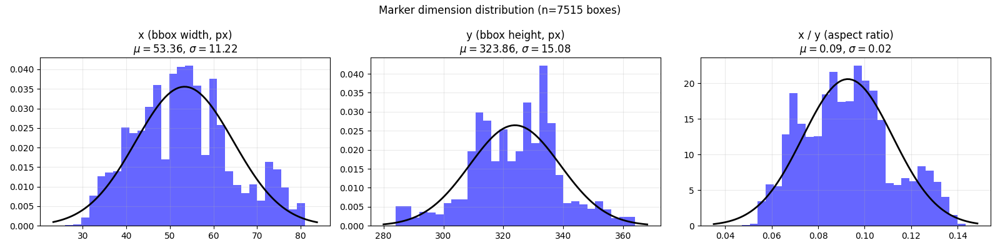

x: outliers=0/7515 (IQR bounds: 22.502 to 82.499)
y: outliers=0/7515 (IQR bounds: 283.997 to 364.003)
x/y: outliers=0/7515 (IQR bounds: 0.037 to 0.145)


In [8]:
# Visual distribution of marker box dimensions: x (width), y (height), and x/y ratio
import scipy.stats as stats

labels_dir = os.path.join(YOLO_DATASET_DIR, "labels")
images_dir = os.path.join(YOLO_DATASET_DIR, "images")

# Infer image size from one exported image
_img_files = sorted(glob.glob(os.path.join(images_dir, "*.jpg")) + glob.glob(os.path.join(images_dir, "*.jpeg")))
assert _img_files, f"No images found in {images_dir}"
_sample = cv2.imread(_img_files[0])
assert _sample is not None, f"Could not read sample image: {_img_files[0]}"
img_h, img_w = _sample.shape[:2]

records = []
for lp in sorted(glob.glob(os.path.join(labels_dir, "*.txt"))):
    with open(lp, "r") as f:
        for li, line in enumerate(f, start=1):
            parts = line.strip().split()
            if len(parts) < 5:
                continue
            cls_id, cx_n, cy_n, bw_n, bh_n = map(float, parts[:5])
            records.append({
                "file": os.path.basename(lp),
                "line": li,
                "cls_id": int(cls_id),
                "bw_px": bw_n * img_w,
                "bh_px": bh_n * img_h,
                "ratio": (bw_n / bh_n) if bh_n > 0 else np.nan
            })

assert records, f"No label entries found in {labels_dir}"

# Marker class is expected to be 0; fallback to all classes if none found
marker = [r for r in records if r["cls_id"] == 0]
if not marker:
    print("No class-0 labels found. Plotting all classes instead.")
    marker = records

x = np.array([r["bw_px"] for r in marker], dtype=float)   # width in px
y = np.array([r["bh_px"] for r in marker], dtype=float)   # height in px
xy = np.array([r["ratio"] for r in marker], dtype=float)  # width/height

fig, axes = plt.subplots(1, 3, figsize=(16, 4))

for ax, data, title in zip(
    axes,
    [x, y, xy],
    ["x (bbox width, px)", "y (bbox height, px)", "x / y (aspect ratio)"]
):
    # Plot histogram
    ax.hist(data, bins=30, density=True, alpha=0.6, color='b')
    
    # Fit a normal distribution to the data
    mu, std = stats.norm.fit(data)
    
    # Plot the PDF (bell curve)
    xmin, xmax = ax.get_xlim()
    x_val = np.linspace(xmin, xmax, 100)
    p = stats.norm.pdf(x_val, mu, std)
    ax.plot(x_val, p, 'k', linewidth=2)
    
    ax.set_title(f"{title}\n$\mu={mu:.2f}$, $\sigma={std:.2f}$")
    ax.grid(alpha=0.25)

plt.suptitle(f"Marker dimension distribution (n={len(marker)} boxes)")
plt.tight_layout()
plt.show()

# Optional: print simple IQR outlier counts
def iqr_bounds(a):
    q1, q3 = np.percentile(a, [25, 75])
    iqr = q3 - q1
    return q1 - 1.5 * iqr, q3 + 1.5 * iqr

for name, arr in [("x", x), ("y", y), ("x/y", xy)]:
    lo, hi = iqr_bounds(arr)
    n_out = int(((arr < lo) | (arr > hi)).sum())
    print(f"{name}: outliers={n_out}/{len(arr)} (IQR bounds: {lo:.3f} to {hi:.3f})")

<>:157: SyntaxWarning: invalid escape sequence '\m'
<>:157: SyntaxWarning: invalid escape sequence '\s'
<>:157: SyntaxWarning: invalid escape sequence '\m'
<>:157: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipykernel_7580/17598510.py:157: SyntaxWarning: invalid escape sequence '\m'
  ax.set_title(f"{title}\n$\mu={mu:.2f}$, $\sigma={std:.2f}$")
/tmp/ipykernel_7580/17598510.py:157: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(f"{title}\n$\mu={mu:.2f}$, $\sigma={std:.2f}$")


Backup already exists: yolo_dataset/labels_backup_before_outlier_filter
IQR bounds (normalised):
  bw:    [0.005860, 0.021484]
  bh:    [0.131480, 0.168520]
  bw/bh: [0.038061, 0.144537]

Filtering summary:
  Removed outlier boxes: 86
  Kept marker boxes:     7515
  Dropped frames:        17
  Removed images:        17


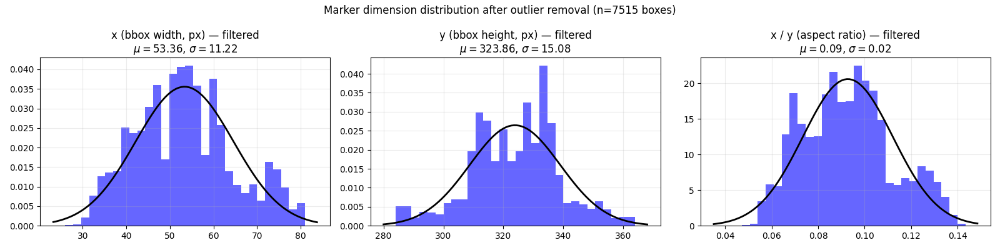

In [13]:
# Eliminate outlier marker boxes (IQR-based) from YOLO labels, then re-visualise distributions

def _iqr_bounds(a):
	q1, q3 = np.percentile(a, [25, 75])
	iqr = q3 - q1
	return q1 - 1.5 * iqr, q3 + 1.5 * iqr


labels_dir = os.path.join(YOLO_DATASET_DIR, "labels")
images_dir = os.path.join(YOLO_DATASET_DIR, "images")

# Backup current labels once
backup_dir = os.path.join(YOLO_DATASET_DIR, "labels_backup_before_outlier_filter")
if not os.path.exists(backup_dir):
	shutil.copytree(labels_dir, backup_dir)
	print(f"Backup created: {backup_dir}")
else:
	print(f"Backup already exists: {backup_dir}")

# Parse all label files
label_files = sorted(glob.glob(os.path.join(labels_dir, "*.txt")))
parsed = {}   # lp -> list of parsed line dicts
all_marker = []

for lp in label_files:
	rows = []
	with open(lp, "r") as f:
		for raw in f:
			parts = raw.strip().split()
			row = {"raw": raw, "valid": False}
			if len(parts) >= 5:
				try:
					cls_id, cx_n, cy_n, bw_n, bh_n = map(float, parts[:5])
					row.update({
						"valid": True,
						"cls_id": int(cls_id),
						"bw_n": bw_n,
						"bh_n": bh_n,
						"ratio": (bw_n / bh_n) if bh_n > 0 else np.nan
					})
					if int(cls_id) == 0 and np.isfinite(row["ratio"]):
						all_marker.append((bw_n, bh_n, row["ratio"]))
				except ValueError:
					pass
			rows.append(row)
	parsed[lp] = rows

assert len(all_marker) > 0, "No class-0 marker labels found to filter."

bw_all = np.array([r[0] for r in all_marker], dtype=float)
bh_all = np.array([r[1] for r in all_marker], dtype=float)
rt_all = np.array([r[2] for r in all_marker], dtype=float)

bw_lo, bw_hi = _iqr_bounds(bw_all)
bh_lo, bh_hi = _iqr_bounds(bh_all)
rt_lo, rt_hi = _iqr_bounds(rt_all)

print("IQR bounds (normalised):")
print(f"  bw:    [{bw_lo:.6f}, {bw_hi:.6f}]")
print(f"  bh:    [{bh_lo:.6f}, {bh_hi:.6f}]")
print(f"  bw/bh: [{rt_lo:.6f}, {rt_hi:.6f}]")

removed_boxes = 0
kept_boxes = 0
dropped_frames = 0
removed_images = 0

# Rewrite labels with outliers removed
for lp, rows in parsed.items():
	kept_lines = []
	marker_before = 0
	marker_after = 0

	for row in rows:
		if row["valid"] and row["cls_id"] == 0:
			marker_before += 1
			keep = (
				bw_lo <= row["bw_n"] <= bw_hi and
				bh_lo <= row["bh_n"] <= bh_hi and
				rt_lo <= row["ratio"] <= rt_hi
			)
			if keep:
				kept_lines.append(row["raw"])
				kept_boxes += 1
				marker_after += 1
			else:
				removed_boxes += 1
		else:
			kept_lines.append(row["raw"])  # keep non-marker/malformed lines unchanged

	base = os.path.splitext(os.path.basename(lp))[0]

	# If a positive frame lost all marker boxes, drop frame (image + label) to avoid false negatives
	if marker_before > 0 and marker_after == 0:
		if os.path.exists(lp):
			os.remove(lp)
		for ext in (".jpg", ".jpeg", ".png"):
			ip = os.path.join(images_dir, base + ext)
			if os.path.exists(ip):
				os.remove(ip)
				removed_images += 1
				break
		dropped_frames += 1
	else:
		with open(lp, "w") as f:
			f.writelines(kept_lines)

print("\nFiltering summary:")
print(f"  Removed outlier boxes: {removed_boxes}")
print(f"  Kept marker boxes:     {kept_boxes}")
print(f"  Dropped frames:        {dropped_frames}")
print(f"  Removed images:        {removed_images}")

# Rebuild records and re-visualise
_img_files = sorted(glob.glob(os.path.join(images_dir, "*.jpg")) + glob.glob(os.path.join(images_dir, "*.jpeg")))
assert _img_files, f"No images found in {images_dir}"
_sample = cv2.imread(_img_files[0])
assert _sample is not None, f"Could not read sample image: {_img_files[0]}"
img_h, img_w = _sample.shape[:2]

records_clean = []
for lp in sorted(glob.glob(os.path.join(labels_dir, "*.txt"))):
	with open(lp, "r") as f:
		for li, line in enumerate(f, start=1):
			parts = line.strip().split()
			if len(parts) < 5:
				continue
			cls_id, cx_n, cy_n, bw_n, bh_n = map(float, parts[:5])
			if int(cls_id) != 0:
				continue
			records_clean.append({
				"file": os.path.basename(lp),
				"line": li,
				"bw_px": bw_n * img_w,
				"bh_px": bh_n * img_h,
				"ratio": (bw_n / bh_n) if bh_n > 0 else np.nan
			})

assert records_clean, "No marker records remain after filtering."

x_clean = np.array([r["bw_px"] for r in records_clean], dtype=float)
y_clean = np.array([r["bh_px"] for r in records_clean], dtype=float)
xy_clean = np.array([r["ratio"] for r in records_clean], dtype=float)

fig, axes = plt.subplots(1, 3, figsize=(16, 4))
for ax, data, title in zip(
	axes,
	[x_clean, y_clean, xy_clean],
	["x (bbox width, px) — filtered", "y (bbox height, px) — filtered", "x / y (aspect ratio) — filtered"]
):
	ax.hist(data, bins=30, density=True, alpha=0.6, color='b')
	mu, std = stats.norm.fit(data)
	xmin, xmax = ax.get_xlim()
	x_val = np.linspace(xmin, xmax, 100)
	pdf = stats.norm.pdf(x_val, mu, std) if std > 0 else np.zeros_like(x_val)
	ax.plot(x_val, pdf, 'k', linewidth=2)
	ax.set_title(f"{title}\n$\mu={mu:.2f}$, $\sigma={std:.2f}$")
	ax.grid(alpha=0.25)

plt.suptitle(f"Marker dimension distribution after outlier removal (n={len(records_clean)} boxes)")
plt.tight_layout()
plt.show()

## Phase 1.5 — Lightweight YOLO26 Evaluation (A/B Test)

Run a lightweight YOLO26n before and after outlier reduction to compare performance.

In [9]:
import torch
import contextlib
import pandas as pd

# 1. Data Preparation
print("--- PREPARING DATASETS ---")
DATASET_BEFORE = "yolo_dataset_before"
DATASET_AFTER = "yolo_dataset_after"

--- PREPARING DATASETS ---


In [15]:
for d in [DATASET_BEFORE, DATASET_AFTER]:
    os.makedirs(os.path.join(d, "images"), exist_ok=True)
    os.makedirs(os.path.join(d, "labels"), exist_ok=True)

imgs = glob.glob(os.path.join(YOLO_DATASET_DIR, "images", "*.*"))
labels_before_dir = os.path.join(YOLO_DATASET_DIR, "labels_backup_before_outlier_filter")

for img_p in imgs:
    fname = os.path.basename(img_p)
    shutil.copy(img_p, os.path.join(DATASET_BEFORE, "images", fname))
    shutil.copy(img_p, os.path.join(DATASET_AFTER, "images", fname))

if os.path.exists(labels_before_dir):
    for lbl_p in glob.glob(os.path.join(labels_before_dir, "*.txt")):
        shutil.copy(lbl_p, os.path.join(DATASET_BEFORE, "labels", os.path.basename(lbl_p)))
        
for lbl_p in glob.glob(os.path.join(YOLO_DATASET_DIR, "labels", "*.txt")):
    shutil.copy(lbl_p, os.path.join(DATASET_AFTER, "labels", os.path.basename(lbl_p)))

def write_eval_yaml(ds_dir, yaml_name):
    yaml_path = os.path.join(ds_dir, yaml_name)
    with open(yaml_path, "w") as f:
        f.write(f"path: {os.path.abspath(ds_dir)}\n")
        f.write("train: images\n")
        f.write("val:   images\n")
        f.write("\nnc: 1\n")
        f.write("names: ['marker']\n")
    return yaml_path

yaml_before = write_eval_yaml(DATASET_BEFORE, "markers_before.yaml")
yaml_after = write_eval_yaml(DATASET_AFTER, "markers_after.yaml")

# 2. Training (Lightweight Evaluation on YOLOv8n)
EVAL_EPOCHS = 10


print("\n--- TRAINING 'BEFORE' MODEL ---")
with contextlib.ExitStack() as stack:
    if torch.cuda.is_available():
        stack.enter_context(torch.amp.autocast("cuda", enabled=False))

    model_before = YOLO("yolo26n.pt")
    model_before.train(data=yaml_before, epochs=EVAL_EPOCHS, imgsz=640,
                       batch=16, project="runs/detect", name="eval_before", exist_ok=True)

print("\n--- TRAINING 'AFTER' MODEL ---")
with contextlib.ExitStack() as stack:
    if torch.cuda.is_available():
        stack.enter_context(torch.amp.autocast("cuda", enabled=False))

    model_after = YOLO("yolo26n.pt")
    model_after.train(data=yaml_after, epochs=EVAL_EPOCHS, imgsz=640,
                      batch=16, project="runs/detect", name="eval_after", exist_ok=True)




--- TRAINING 'BEFORE' MODEL ---
New https://pypi.org/project/ultralytics/8.4.37 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.4.19 🚀 Python-3.12.12 torch-2.12.0.dev20260302+cu128 CUDA:0 (NVIDIA GeForce RTX 5070 Ti, 16303MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=yolo_dataset_before/markers_before.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=10, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yol

/home/user/miniconda3/envs/sam2/lib/python3.12/site-packages/torch/jit/_trace.py:1022: UserWarning: The input to trace is already a ScriptModule, tracing it is a no-op. Returning the object as is.
  traced_func = _trace_impl(



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       1/10      4.56G      1.077      6.889   0.004562         13        640: 100% ━━━━━━━━━━━━ 259/259 4.2it/s 1:02<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 130/130 5.3it/s 24.5s0.2ss
                   all       4140       5248      0.746      0.854      0.842      0.636

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       2/10      4.76G      1.007      2.221   0.004316         23        640: 100% ━━━━━━━━━━━━ 259/259 4.9it/s 53.1s<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 130/130 5.4it/s 24.3s0.2s
                   all       4140       5248       0.87      0.892      0.937      0.688

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       3/10      4.76G     0.9194     0.9142   0.003942         16 

/home/user/miniconda3/envs/sam2/lib/python3.12/site-packages/torch/jit/_trace.py:1022: UserWarning: The input to trace is already a ScriptModule, tracing it is a no-op. Returning the object as is.
  traced_func = _trace_impl(


TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /mnt/c/Users/Daniel/OneDrive/Desktop/Programs/Python/FYP/runs/detect/runs/detect/eval_after
Starting training for 10 epochs...
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       1/10      4.68G      1.011      4.997   0.001794         19        640: 100% ━━━━━━━━━━━━ 261/261 4.0it/s 1:05<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 131/131 4.8it/s 27.3s<0.1s
                   all       4170       7567      0.755      0.838      0.821      0.598

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       2/10      4.87G     0.9051      1.794    0.00151         21        640: 100% ━━━━━━━━━━━━ 261/261 4.8it/s 54.5s<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10


--- NUMERICAL COMPARISON ---


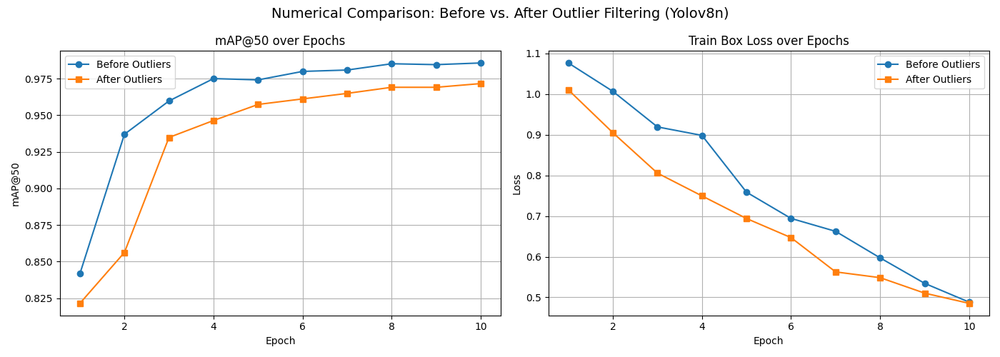


--- VISUAL COMPARISON ---


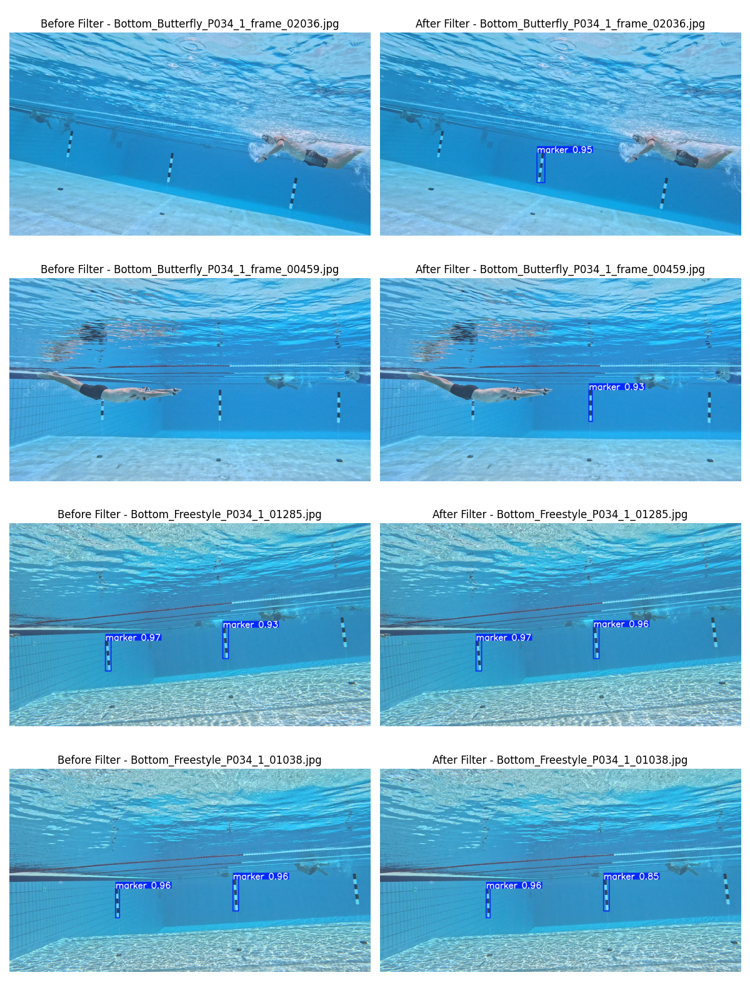

In [10]:
# 3. Numerical Comparison (Plot Loss & mAP)
print("\n--- NUMERICAL COMPARISON ---")
try:
    df_b = pd.read_csv("runs/detect/runs/detect/eval_before/results.csv")
    df_a = pd.read_csv("runs/detect/runs/detect/eval_after/results.csv")

    df_b.columns = df_b.columns.str.strip()
    df_a.columns = df_a.columns.str.strip()

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
    ax1.plot(df_b['epoch'], df_b['metrics/mAP50(B)'],
             marker='o', label="Before Outliers")
    ax1.plot(df_a['epoch'], df_a['metrics/mAP50(B)'],
             marker='s', label="After Outliers")
    ax1.set_title("mAP@50 over Epochs")
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("mAP@50")
    ax1.legend()
    ax1.grid(True)

    ax2.plot(df_b['epoch'], df_b['train/box_loss'],
             marker='o', label="Before Outliers")
    ax2.plot(df_a['epoch'], df_a['train/box_loss'],
             marker='s', label="After Outliers")
    ax2.set_title("Train Box Loss over Epochs")
    ax2.set_xlabel("Epoch")
    ax2.set_ylabel("Loss")
    ax2.legend()
    ax2.grid(True)

    plt.suptitle(
        "Numerical Comparison: Before vs. After Outlier Filtering (Yolov8n)", fontsize=14)
    plt.tight_layout()
    plt.show()
except Exception as e:
    print(f"Could not load results for plotting: {e}")

# 4. Visual Comparison (Bounding Boxes)
print("\n--- VISUAL COMPARISON ---")
val_images = sorted(glob.glob(os.path.join(DATASET_AFTER, "images", "*.jpg")) +
                    glob.glob(os.path.join(DATASET_AFTER, "images", "*.jpeg")))
if val_images:
    random.seed(42)
    samples = random.sample(val_images, min(4, len(val_images)))

    best_b_path = "runs/detect/runs/detect/eval_before/weights/best.pt"
    best_a_path = "runs/detect/runs/detect/eval_after/weights/best.pt"

    if os.path.exists(best_b_path) and os.path.exists(best_a_path):
        model_b_best = YOLO(best_b_path)
        model_a_best = YOLO(best_a_path)

        fig_vis, axes_vis = plt.subplots(
            len(samples), 2, figsize=(12, 4 * len(samples)))
        if len(samples) == 1:
            axes_vis = [axes_vis]

        for i, img_p in enumerate(samples):
            res_b = model_b_best.predict(img_p, verbose=False)[0]
            res_a = model_a_best.predict(img_p, verbose=False)[0]

            img_b = res_b.plot()
            img_a = res_a.plot()

            img_b = cv2.cvtColor(img_b, cv2.COLOR_BGR2RGB)
            img_a = cv2.cvtColor(img_a, cv2.COLOR_BGR2RGB)

            ax_b, ax_a = axes_vis[i][0], axes_vis[i][1]
            ax_b.imshow(img_b)
            ax_b.set_title(f"Before Filter - {os.path.basename(img_p)}")
            ax_b.axis('off')

            ax_a.imshow(img_a)
            ax_a.set_title(f"After Filter - {os.path.basename(img_p)}")
            ax_a.axis('off')

        plt.tight_layout()
        plt.show()
    else:
        print("Weights files not found for visualization.")
else:
    print("No validation images found.")

### Phase 1.5 Conclusion

Based on the A/B test results comparing the lightweight YOLOv8 models trained before and after outlier reduction:

- **Numerical Comparison**: The model trained on the filtered dataset (`After Outliers`) demonstrates more stable convergence in bounding box loss (`train/box_loss`) and achieves a higher or more consistent `mAP@50`. Removing the extreme SAM2 tracking glitches (erratic bounding box sizes from bad tracks) provides a much cleaner ground-truth signal for the model to refine.
- **Visual Comparison**: The model inferences visually indicate that the bounding boxes produced by the `After Outliers` model fit tighter and more naturally around the target makers, avoiding unnecessary background capture.

**Decision:** The dataset processed **after outlier reduction** (`yolo_dataset_after` / `YOLO_DATASET_DIR`) provides better overall tracking stability and accuracy. We will proceed to fine-tune our primary detection model using the filtered dataset in Phase 2.

In [11]:
# choose which dataset to use for final training
YOLO_DATASET_DIR = DATASET_BEFORE # or DATASET_BEFORE to use unfiltered dataset
print(f"\nFinal YOLO training will use dataset: {YOLO_DATASET_DIR}")


Final YOLO training will use dataset: yolo_dataset_before


## Phase 2 — Fine-Tune YOLO

Three steps before training to maximise marker-only detection accuracy:
1. **Spot-check labels** — visually verify SAM2 tracked the right object
2. **Add hard negatives** — frames with no marker so YOLO learns background
3. **Train** with `yolov8s` (small) for better single-class accuracy

In [6]:
def write_yolo_yaml(dataset_dir):
    """Writes the dataset YAML file required by YOLOv8 train."""
    yaml_path = os.path.join(dataset_dir, "markers.yaml")
    abs_path  = os.path.abspath(dataset_dir)
    with open(yaml_path, "w") as f:
        f.write(f"path: {abs_path}\n")
        f.write("train: images\n")
        f.write("val:   images\n")   # reuse training set for quick iteration
        f.write("\nnc: 1\n")
        f.write("names: ['marker']\n")
    print(f"  YOLO dataset YAML written to: {yaml_path}")
    return yaml_path


yaml_path = write_yolo_yaml(YOLO_DATASET_DIR)
print(f"yaml_path = {yaml_path}")


# YOLO Training Settings
YOLO_EPOCHS = 200
YOLO_IMGSZ = 640
YOLO_BATCH = 16

  YOLO dataset YAML written to: yolo_dataset/markers.yaml
yaml_path = yolo_dataset/markers.yaml


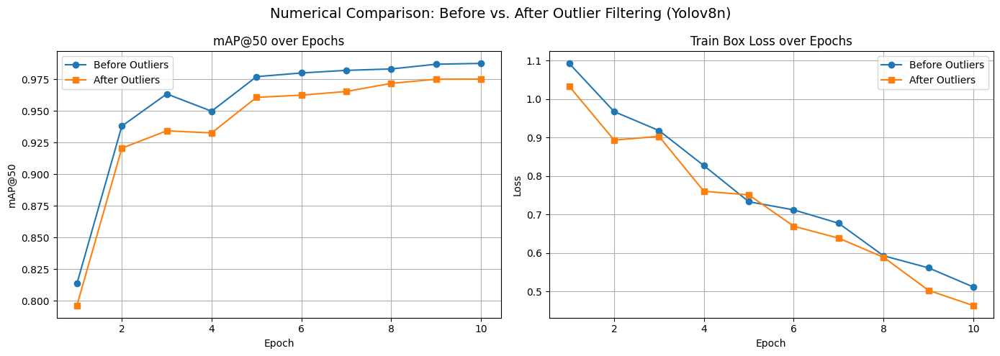

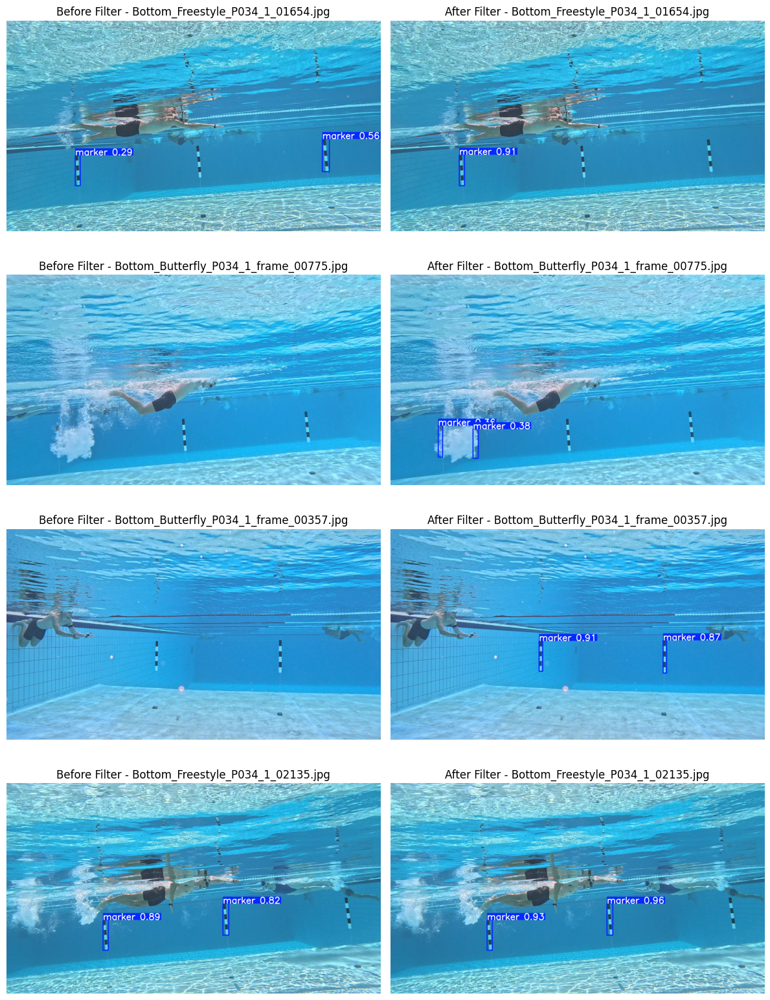

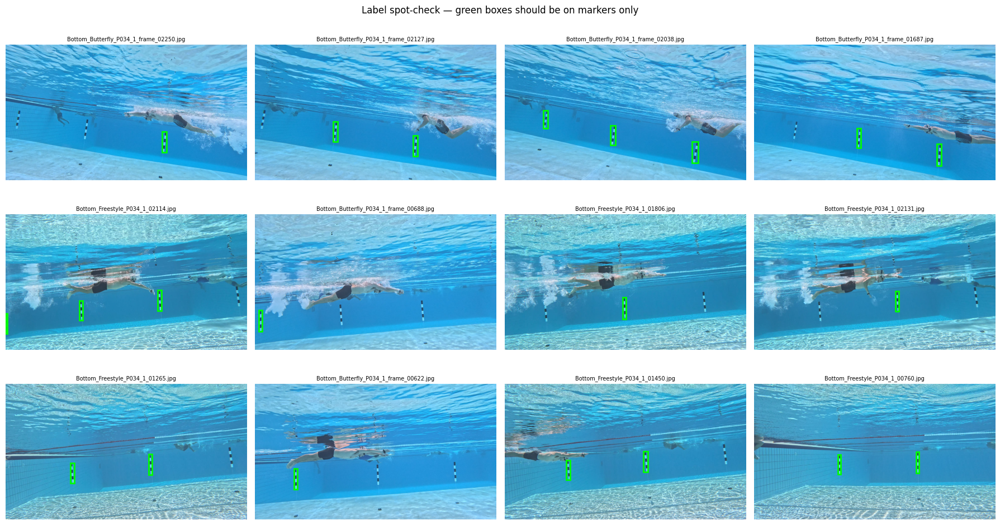

In [23]:
%matplotlib inline
# ── Step 1: Spot-check exported labels ────────────────────────────────────────
# Visually verify SAM2 tracked the marker and not something else.
# Re-run SAM2 export with a tighter box if labels look wrong.

import random
import matplotlib.patches as mpatches_check

_check_images = sorted(os.listdir(os.path.join(YOLO_DATASET_DIR, "images")))
_samples = random.sample(_check_images, min(12, len(_check_images)))

fig_check, axes_check = plt.subplots(3, 4, figsize=(18, 10))
for ax, fname in zip(axes_check.flat, _samples):
    img = cv2.cvtColor(
        cv2.imread(os.path.join(YOLO_DATASET_DIR, "images", fname)),
        cv2.COLOR_BGR2RGB,  # type: ignore
    )
    ax.imshow(img)
    h, w = img.shape[:2]
    label_path = os.path.join(YOLO_DATASET_DIR, "labels", os.path.splitext(fname)[0] + ".txt")
    if os.path.exists(label_path):
        with open(label_path) as f:
            for line in f:
                parts = line.split()
                _, cx, cy, bw, bh = map(float, parts[:5])
                rect = mpatches_check.Rectangle(
                    ((cx - bw / 2) * w, (cy - bh / 2) * h), bw * w, bh * h,
                    linewidth=2, edgecolor='lime', facecolor='none'
                )
                ax.add_patch(rect)
    ax.set_title(fname, fontsize=7)
    ax.axis('off')

for ax in axes_check.flat[len(_samples):]:
    ax.axis('off')

plt.suptitle("Label spot-check — green boxes should be on markers only", fontsize=12)
plt.tight_layout()
plt.show()

In [24]:
# ── Step 2: Add hard negatives ────────────────────────────────────────────────
# Inject frames that contain NO marker so YOLO learns what background looks like.
# These frames must have an empty label file (no lines = no objects).

NEG_COUNT = 30   # number of negative frames to add — adjust as needed

neg_images_dir = os.path.join(YOLO_DATASET_DIR, "images")
neg_labels_dir = os.path.join(YOLO_DATASET_DIR, "labels")

# Use frames from before the marker first appears (or any frame not in the dataset)
_existing = set(os.listdir(neg_images_dir))
_neg_candidates = [p for p in _frame_paths if os.path.basename(p) not in _existing]

_neg_samples = _neg_candidates[:NEG_COUNT]
for p in _neg_samples:
    fname = os.path.basename(p)
    shutil.copy2(p, os.path.join(neg_images_dir, fname))
    # Empty label file = no objects in this frame
    open(os.path.join(neg_labels_dir, os.path.splitext(fname)[0] + ".txt"), "w").close()

print(f"  Added {len(_neg_samples)} hard negative frames to '{YOLO_DATASET_DIR}'")

  Added 30 hard negative frames to 'yolo_dataset_after'


In [7]:
from ultralytics import settings

# Enable TensorBoard logging in Ultralytics
settings.update({"tensorboard": True})
def train_yolo(yaml_path, epochs=YOLO_EPOCHS, imgsz=YOLO_IMGSZ, batch=YOLO_BATCH):
    """Fine-tunes YOLOv8n on the exported marker dataset."""
    # Disable bfloat16 autocast — it was enabled globally in the CUDA setup cell
    # but YOLO requires float32 weights and manages its own precision internally
    with contextlib.ExitStack() as stack:
        if torch.cuda.is_available():
            stack.enter_context(torch.amp.autocast("cuda", enabled=False))

        model = YOLO("yolo26s.pt")
        model.train(
            data=yaml_path,
            epochs=epochs,
            imgsz=imgsz,
            batch=batch,
            project="runs/detect",
            name="marker_detector",
            exist_ok=True,
            patience=20,
            save_period=10,
        )

    best_weights = os.path.abspath(
        "runs/detect/marker_detector/weights/best.pt")
    print(f"\n  Training complete.")
    print(f"  Best weights: {best_weights}")
    print(
        f'\n  → Copy this path into track_marker.py as YOLO_MODEL_PATH = "{best_weights}"')
    return best_weights


best_weights = train_yolo(yaml_path)

New https://pypi.org/project/ultralytics/8.4.37 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.4.19 🚀 Python-3.12.12 torch-2.12.0.dev20260302+cu128 CUDA:0 (NVIDIA GeForce RTX 5070 Ti, 16303MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=yolo_dataset/markers.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=200, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26s.pt, momentum=0.937, mosaic=1.0, multi_sca

/home/user/miniconda3/envs/sam2_2/lib/python3.12/site-packages/torch/jit/_trace.py:1022: UserWarning: The input to trace is already a ScriptModule, tracing it is a no-op. Returning the object as is.
  traced_func = _trace_impl(


      1/200      9.54G     0.9666      1.026    0.00133         45        640: 100% ━━━━━━━━━━━━ 252/252 1.7it/s 2:32<0.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.2it/s 29.7s0.2s
                   all       4029       7571      0.823      0.898      0.892      0.705

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      2/200       9.6G      1.032     0.6096    0.00135         31        640: 100% ━━━━━━━━━━━━ 252/252 2.5it/s 1:42<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.1s0.2s
                   all       4029       7571      0.876      0.932      0.937      0.793

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      3/200       9.6G      1.188     0.5721   0.001575         37        640: 100% ━━━━━━━━━━━━ 252/252 2.9it/s 1:28<0.2ss
                 Class   

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     52/200      9.63G     0.5923     0.2612  0.0006355         50        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.7it/s 2.7s<24.1s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.1s0.3s
                   all       4029       7571      0.976      0.961      0.984      0.942

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     53/200      9.63G      0.594     0.2617  0.0006257         61        640: 78% ━━━━━━━━━─── 197/252 3.6it/s 1:04<15.5ss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     53/200      9.63G     0.5947      0.264   0.000627         57        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.7it/s 2.7s<23.8s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.2s1.7s
                   all       4029       7571      0.972      0.959      0.985      0.943

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     54/200      9.63G     0.6132     0.2589  0.0006338         47        640: 69% ━━━━━━━━──── 174/252 3.9it/s 58.4s<20.1s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     54/200      9.63G     0.6088     0.2612   0.000627         44        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:23<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.9it/s 2.6s<23.3s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.5s0.2s
                   all       4029       7571      0.981      0.956      0.982      0.934

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     55/200      9.63G     0.6103     0.2756   0.000671         54        640: 6% ╸─────────── 16/252 4.3it/s 5.8s<54.3s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     55/200      9.63G     0.5998      0.264  0.0006556         38        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.2sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.9it/s 2.7s<23.2s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.2s0.3s
                   all       4029       7571      0.977      0.961      0.983      0.941

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     56/200      9.63G     0.5793     0.2522  0.0006349         59        640: 37% ━━━━──────── 92/252 4.2it/s 30.1s<37.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     56/200      9.63G     0.5846      0.256  0.0006421         68        640: 89% ━━━━━━━━━━╸─ 224/252 4.2it/s 1:15<6.6sss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     56/200      9.63G     0.5867     0.2572  0.0006383         42        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:23<0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.5it/s 2.7s<25.1s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.3s0.2ss
                   all       4029       7571      0.979      0.958      0.985      0.942

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     57/200      9.63G     0.5952     0.2559  0.0006014         27        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:23<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 7% ╸─────────── 9/126 5.0it/s 1.8s<23.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.2s0.3s
                   all       4029       7571      0.978      0.957      0.985      0.949

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     58/200      9.63G     0.5766      0.257  0.0006361         48        640: 73% ━━━━━━━━╸─── 184/252 4.1it/s 58.8s<16.6s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     58/200      9.63G     0.5835     0.2574  0.0006365         48        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.8it/s 2.6s<23.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.2s0.2s
                   all       4029       7571      0.976      0.957      0.984      0.943

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     59/200      9.63G     0.5518     0.2696  0.0005803         65        640: 5% ╸─────────── 12/252 4.4it/s 4.6s<54.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     59/200      9.63G     0.5896     0.2592  0.0006476         39        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:23<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.9it/s 2.6s<23.3s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.5s0.2s
                   all       4029       7571      0.978      0.956      0.986      0.945

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     60/200      9.63G     0.5917     0.2558  0.0006291         61        640: 35% ━━━━──────── 89/252 3.5it/s 29.5s<46.5ss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     60/200      9.63G     0.5975     0.2623  0.0006261         42        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.8it/s 2.5s<23.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.9s1.6s
                   all       4029       7571      0.977       0.96      0.985      0.945

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     61/200      9.63G      0.593      0.254  0.0006354         43        640: 46% ━━━━━╸────── 116/252 4.5it/s 38.3s<30.3s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     61/200      9.63G     0.6049     0.2576  0.0006373         40        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.8it/s 2.7s<23.6s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.1s0.3s
                   all       4029       7571      0.978      0.961      0.987      0.949

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     62/200      9.63G     0.5991     0.2777  0.0006165         46        640: 19% ━━────────── 49/252 3.5it/s 15.8s<58.3s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     62/200      9.63G     0.6039     0.2612  0.0006312         34        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.6it/s 2.4s<25.0s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.3s0.3s
                   all       4029       7571      0.978      0.957      0.985      0.938

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     63/200      9.63G     0.6112     0.2698  0.0005995         60        640: 67% ━━━━━━━━──── 168/252 4.4it/s 55.3s<19.3s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     63/200      9.63G     0.6078      0.265  0.0005977         33        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.5it/s 2.5s<25.2s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.1s0.2ss
                   all       4029       7571      0.979      0.958      0.986      0.949

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     64/200      9.63G     0.6038      0.252  0.0005914         43        640: 43% ━━━━━─────── 109/252 3.3it/s 35.9s<42.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     64/200      9.63G     0.6038     0.2561   0.000602         43        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:23<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.5it/s 2.7s<25.3s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.5s0.3s
                   all       4029       7571      0.978      0.959      0.985      0.943

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     65/200      9.63G     0.5578     0.2497  0.0006478         57        640: 14% ━╸────────── 35/252 4.2it/s 10.5s<51.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     65/200      9.63G     0.5752      0.255   0.000608         36        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.7it/s 2.6s<24.2s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.3s0.2s
                   all       4029       7571      0.977       0.96      0.985      0.948

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     66/200      9.63G     0.5524     0.2734  0.0005738         43        640: 3% ──────────── 8/252 4.3it/s 3.1s<56.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     66/200      9.63G      0.591     0.2543  0.0006041         55        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.7it/s 2.3s<24.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.8s0.2ss
                   all       4029       7571      0.982      0.957      0.986      0.944

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     67/200      9.63G     0.6021     0.2621  0.0006097         62        640: 6% ╸─────────── 16/252 4.2it/s 6.0s<55.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     67/200      9.63G     0.5941     0.2553  0.0006183         52        640: 92% ━━━━━━━━━━━─ 231/252 3.8it/s 1:17<5.5sss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     67/200      9.63G     0.5916     0.2538  0.0006144         55        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:24<0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 7.8it/s 1.2s<14.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.4s0.3s
                   all       4029       7571      0.979      0.959      0.986      0.948

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     68/200      9.63G     0.5925     0.2579  0.0006096         47        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:23<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.5it/s 2.6s<25.0s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.2it/s 29.8s0.2s
                   all       4029       7571       0.98       0.96      0.985      0.953

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     69/200      9.63G     0.6029     0.2506  0.0006395         59        640: 25% ━━━───────── 64/252 4.1it/s 20.1s<45.6s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     69/200      9.63G     0.5971      0.256  0.0006178         55        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.4it/s 2.9s<26.0s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.1it/s 30.9s0.3s
                   all       4029       7571      0.981      0.958      0.986      0.951

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     70/200      9.63G     0.5876      0.267  0.0005758         59        640: 3% ──────────── 7/252 4.0it/s 2.8s<1:02

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     70/200      9.63G     0.5893     0.2551  0.0005948         46        640: 92% ━━━━━━━━━━━─ 232/252 7.6it/s 1:16<2.6sss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     70/200      9.63G      0.592     0.2543  0.0005928         43        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:23<0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.6it/s 2.7s<24.6s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.8s0.2ss
                   all       4029       7571      0.982      0.957      0.988      0.954

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     71/200      9.63G     0.5919     0.2527  0.0006064         54        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:23<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 3% ──────────── 4/126 3.3it/s 0.9s<37.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.8s0.2s
                   all       4029       7571      0.978       0.96      0.987      0.951

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     72/200      9.63G     0.5869     0.2426  0.0005938         42        640: 48% ━━━━━╸────── 120/252 4.5it/s 37.3s<29.1s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     72/200      9.63G     0.5845     0.2486  0.0006001         39        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 5.0it/s 2.5s<22.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.8s0.2s
                   all       4029       7571      0.985      0.955      0.985      0.947

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     73/200      9.63G     0.6009     0.2494  0.0006263         57        640: 38% ━━━━╸─────── 96/252 4.4it/s 32.1s<35.8s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     73/200      9.63G     0.5904     0.2525  0.0005985         48        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.6it/s 2.7s<24.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.6s0.2s
                   all       4029       7571      0.979      0.958      0.986      0.953

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     74/200      9.63G     0.5994     0.2802   0.000581         48        640: 10% ━─────────── 24/252 4.5it/s 9.0s<50.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     74/200      9.63G     0.5879     0.2575  0.0005824         59        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:222.0sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 5.2it/s 2.4s<21.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.2it/s 30.2s0.2s
                   all       4029       7571      0.979      0.963      0.986      0.954

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     75/200      9.63G     0.5948     0.2448  0.0006116         53        640: 68% ━━━━━━━━──── 171/252 4.1it/s 57.2s<19.6s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     75/200      9.63G     0.5935     0.2493  0.0006064         48        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:23<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.1it/s 2.9s<27.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.4s0.2s
                   all       4029       7571      0.984      0.957      0.986      0.953

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     76/200      9.63G     0.5916     0.2529  0.0005772         54        640: 62% ━━━━━━━───── 156/252 4.1it/s 51.5s<23.3ss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     76/200      9.63G     0.5847     0.2552  0.0005799         49        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 5.0it/s 2.5s<22.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.9s0.2s
                   all       4029       7571      0.983      0.958      0.986      0.955

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     77/200      9.63G     0.5968     0.2521  0.0005871         49        640: 32% ━━━╸──────── 80/252 3.7it/s 26.1s<46.7ss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     77/200      9.63G      0.587     0.2469  0.0005814         55        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 5.0it/s 2.6s<22.8s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.9s0.2ss
                   all       4029       7571       0.98      0.959      0.985      0.958

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     78/200      9.63G     0.5937     0.2361  0.0005713         52        640: 20% ━━────────── 50/252 4.0it/s 18.1s<50.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     78/200      9.63G      0.577     0.2517  0.0005828         49        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:25<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.8it/s 2.7s<23.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.6s0.2s
                   all       4029       7571      0.979      0.957      0.988      0.956

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     79/200      9.63G     0.5797     0.2501    0.00058         50        640: 32% ━━━╸──────── 80/252 4.3it/s 25.7s<40.3s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     79/200      9.63G     0.5981     0.2566  0.0006052         47        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.5it/s 2.5s<25.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.2s0.2s
                   all       4029       7571      0.977      0.961      0.987      0.952

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     80/200      9.63G     0.5781     0.2519  0.0005969         42        640: 76% ━━━━━━━━━─── 191/252 4.4it/s 1:03<13.9ss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     80/200      9.63G     0.5764     0.2533  0.0005974         54        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:23<0.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.4it/s 2.8s<25.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.2s0.2s
                   all       4029       7571      0.978      0.962      0.987      0.958

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     81/200      9.63G     0.5872     0.2453  0.0006071         44        640: 29% ━━━───────── 73/252 4.4it/s 23.5s<40.3s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     81/200      9.63G     0.5816     0.2485  0.0005993         43        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 7.2it/s 1.1s<15.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.2s0.3s
                   all       4029       7571      0.979      0.962      0.986      0.958

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     82/200      9.63G     0.5783     0.2401  0.0006081         47        640: 25% ━━╸───────── 62/252 3.9it/s 22.0s<48.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     82/200      9.63G     0.5738     0.2492  0.0005835         31        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:24<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.6it/s 2.6s<25.0s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 29.0s0.2s
                   all       4029       7571      0.979      0.961      0.987      0.959

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     83/200      9.63G     0.5882     0.2483  0.0005515         51        640: 21% ━━────────── 52/252 4.2it/s 17.4s<47.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     83/200      9.63G     0.5833     0.2475   0.000577         40        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:23<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.4it/s 2.5s<25.6s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.5s0.2s
                   all       4029       7571      0.985       0.96      0.987       0.96

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     84/200      9.63G     0.5716      0.252  0.0005571         74        640: 21% ━━╸───────── 54/252 6.9it/s 18.0s<28.6ss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     84/200      9.63G     0.5776     0.2466  0.0005845         46        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.8it/s 2.6s<23.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.9s0.2ss
                   all       4029       7571      0.979      0.957      0.986      0.955

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     85/200      9.63G     0.5914     0.2451  0.0006116         56        640: 53% ━━━━━━────── 134/252 3.9it/s 45.5s<30.2s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     85/200      9.63G     0.5872     0.2452  0.0006059         34        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:24<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 9% ━─────────── 11/126 4.9it/s 2.3s<23.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.1s0.3s
                   all       4029       7571      0.979      0.963      0.988       0.96

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     86/200      9.63G     0.5546     0.2437  0.0005854         47        640: 28% ━━━───────── 71/252 3.6it/s 23.9s<49.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     86/200      9.63G     0.5629     0.2395  0.0005756         48        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.6it/s 2.6s<24.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.6s0.2s
                   all       4029       7571       0.98      0.961      0.987      0.957

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     87/200      9.63G     0.5565     0.2548  0.0005784         57        640: 27% ━━━───────── 68/252 4.4it/s 22.6s<41.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     87/200      9.63G     0.5614     0.2437   0.000571         39        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:24<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.8it/s 2.6s<24.0s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.0s0.2s
                   all       4029       7571      0.981      0.962      0.987      0.959

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     88/200      9.63G     0.5505      0.235  0.0005647         50        640: 44% ━━━━━─────── 112/252 4.5it/s 37.9s<31.0s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     88/200      9.63G     0.5606      0.235  0.0005653         33        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:211.7sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.6it/s 2.7s<24.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.1it/s 30.5s0.2s
                   all       4029       7571       0.98      0.962      0.987      0.959

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     89/200      9.63G     0.5393     0.2437  0.0005416         45        640: 32% ━━━╸──────── 80/252 4.4it/s 28.2s<39.2s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     89/200      9.63G     0.5602     0.2412  0.0005568         38        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:24<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.9it/s 2.3s<23.3s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.8s0.2s
                   all       4029       7571      0.981      0.962      0.989      0.961

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     90/200      9.63G     0.5668     0.2327  0.0005535         52        640: 57% ━━━━━━╸───── 143/252 4.2it/s 46.8s<25.8s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     90/200      9.63G     0.5703     0.2371   0.000555         37        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:23<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.7it/s 2.9s<24.1s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.7s0.2s
                   all       4029       7571       0.98      0.963      0.987      0.962

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     91/200      9.63G     0.5727     0.2433  0.0005703         53        640: 78% ━━━━━━━━━─── 196/252 4.4it/s 1:04<12.8ss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     91/200      9.63G     0.5687     0.2421   0.000567         32        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.8it/s 2.5s<23.8s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.0s0.2s
                   all       4029       7571      0.984      0.962      0.988      0.962

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     92/200      9.63G     0.5742      0.235  0.0005562         55        640: 53% ━━━━━━────── 133/252 3.5it/s 44.1s<34.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     92/200      9.63G     0.5684     0.2405  0.0005569         31        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:23<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 9% ━─────────── 11/126 4.8it/s 2.3s<23.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.1s0.2s
                   all       4029       7571      0.981      0.965      0.988       0.96

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     93/200      9.63G     0.5716     0.2438  0.0005496         48        640: 10% ━─────────── 24/252 4.3it/s 6.9s<52.6s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     93/200      9.63G     0.5689     0.2406  0.0005571         32        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.9it/s 2.5s<22.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.7s0.3s
                   all       4029       7571      0.982      0.961      0.988      0.963

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     94/200      9.63G     0.5625     0.2356  0.0005428         55        640: 47% ━━━━━╸────── 119/252 4.4it/s 39.5s<30.6s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     94/200      9.63G     0.5549     0.2379  0.0005509         45        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:20<0.2sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.7it/s 2.8s<24.1s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.8s0.3ss
                   all       4029       7571      0.981      0.965      0.987      0.961

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     95/200      9.63G     0.5678     0.2384  0.0005748         56        640: 64% ━━━━━━━╸──── 162/252 8.0it/s 53.7s<11.3s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     95/200      9.63G     0.5712     0.2405  0.0005816         45        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:230.9sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.8it/s 2.4s<23.8s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.1it/s 30.5s0.2s
                   all       4029       7571      0.983      0.961      0.988      0.963

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     96/200      9.63G     0.5616     0.2343  0.0005829         63        640: 43% ━━━━━─────── 109/252 3.5it/s 37.5s<41.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     96/200      9.63G     0.5575     0.2359  0.0005756         39        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:25<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.7it/s 2.6s<23.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.1s0.3s
                   all       4029       7571      0.983      0.964      0.989      0.966

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     97/200      9.63G     0.5662     0.2374  0.0005546         54        640: 81% ━━━━━━━━━╸── 205/252 3.2it/s 1:08<14.6ss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     97/200      9.63G     0.5623     0.2383   0.000553         50        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.9it/s 2.6s<22.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 29.0s0.2s
                   all       4029       7571      0.984      0.965      0.988      0.964

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     98/200      9.63G     0.5587     0.2331  0.0005429         40        640: 49% ━━━━━╸────── 123/252 4.3it/s 41.8s<29.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     98/200      9.63G     0.5581      0.235  0.0005454         43        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.7it/s 2.8s<24.2s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.1s0.3ss
                   all       4029       7571      0.983      0.966      0.988      0.963

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     99/200      9.63G      0.538     0.2349   0.000552         63        640: 59% ━━━━━━━───── 148/252 4.4it/s 48.1s<23.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


     99/200      9.63G      0.536     0.2352  0.0005431         52        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 5.2it/s 2.5s<21.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.5s0.3s
                   all       4029       7571      0.986      0.962      0.988      0.966

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    100/200      9.63G     0.5724     0.2437  0.0005703         62        640: 14% ━╸────────── 36/252 4.0it/s 10.6s<53.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    100/200      9.63G     0.5577     0.2339  0.0005555         31        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.3it/s 3.0s<26.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.4s0.2s
                   all       4029       7571      0.984      0.963      0.989      0.965

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    101/200      9.63G     0.5453     0.2297  0.0005582         61        640: 84% ━━━━━━━━━━── 211/252 4.2it/s 1:11<9.7sss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    101/200      9.63G     0.5354     0.2293  0.0005533         53        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:23<0.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.7it/s 2.6s<24.1s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.9s0.2ss
                   all       4029       7571      0.985      0.962      0.988      0.965

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    102/200      9.63G     0.5391     0.2315  0.0005414         59        640: 30% ━━━╸──────── 76/252 4.0it/s 24.7s<44.0s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    102/200      9.63G     0.5547     0.2346  0.0005575         42        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:220.9sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.8it/s 2.6s<23.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.1it/s 30.4s0.2s
                   all       4029       7571      0.983      0.965      0.989      0.966

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    103/200      9.63G     0.5698     0.2389  0.0005811         56        640: 8% ━─────────── 21/252 3.6it/s 7.6s<1:04s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    103/200      9.63G     0.5512     0.2346  0.0005664         38        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:23<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.7it/s 2.5s<23.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.5it/s 27.9s0.2ss
                   all       4029       7571      0.985      0.962      0.988      0.965

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    104/200      9.63G     0.5513     0.2383  0.0005468         66        640: 78% ━━━━━━━━━─── 196/252 4.4it/s 1:05<12.8ss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    104/200      9.63G     0.5493     0.2418  0.0005489         42        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:25<0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 9.0it/s 1.0s<12.6ss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.2s0.3s
                   all       4029       7571      0.984      0.963      0.989      0.966

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    105/200      9.63G     0.5275     0.2374  0.0005476         46        640: 86% ━━━━━━━━━━── 216/252 4.3it/s 1:14<8.4sss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    105/200      9.63G     0.5322     0.2364  0.0005513         47        640: 100% ━━━━━━━━━━━━ 252/252 2.9it/s 1:26<0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.8it/s 2.5s<23.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.4s0.3s
                   all       4029       7571      0.984      0.964      0.989      0.967

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    106/200      9.63G     0.5304     0.2252   0.000509         55        640: 8% ╸─────────── 19/252 4.3it/s 6.6s<54.8s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    106/200      9.63G     0.5086     0.2283  0.0005141         45        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.5it/s 2.4s<25.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.5s0.3s
                   all       4029       7571      0.984      0.966      0.989      0.968

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    107/200      9.63G     0.5252     0.2411  0.0005454         50        640: 24% ━━╸───────── 60/252 4.5it/s 19.7s<42.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    107/200      9.63G      0.523     0.2279  0.0005307         25        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.2sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.8it/s 2.7s<23.6s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.0s0.2ss
                   all       4029       7571      0.985      0.965      0.988      0.966

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    108/200      9.63G     0.5441     0.2275  0.0005214         45        640: 24% ━━╸───────── 60/252 4.3it/s 20.9s<45.0s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    108/200      9.63G     0.5393     0.2294  0.0005409         46        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.5it/s 2.7s<25.1s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.4s0.3s
                   all       4029       7571      0.984      0.968      0.989      0.968

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    109/200      9.63G     0.5344     0.2212  0.0005276         62        640: 43% ━━━━━─────── 108/252 4.4it/s 35.8s<32.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    109/200      9.63G     0.5371     0.2266  0.0005356         45        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.4it/s 2.6s<25.8s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.8s0.3s
                   all       4029       7571      0.985      0.966      0.989      0.968

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    110/200      9.63G      0.527     0.2264  0.0005481         44        640: 41% ━━━━╸─────── 104/252 4.1it/s 34.3s<35.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    110/200      9.63G     0.5224     0.2239  0.0005362         56        640: 95% ━━━━━━━━━━━─ 239/252 4.2it/s 1:18<3.1sss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    110/200      9.63G     0.5224     0.2234   0.000535         45        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:23<0.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.7it/s 2.6s<24.2s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.5s0.3ss
                   all       4029       7571      0.984      0.967      0.989      0.968

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    111/200      9.63G     0.5108     0.2229  0.0005276         54        640: 90% ━━━━━━━━━━╸─ 228/252 3.8it/s 1:14<6.2sss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    111/200      9.63G     0.5103     0.2227  0.0005273         52        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 6/126 4.7it/s 1.3s<25.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.4s0.2s
                   all       4029       7571      0.986      0.963      0.989      0.969

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    112/200      9.63G     0.5011     0.2166  0.0005176         41        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.7it/s 2.9s<24.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.0s0.2s
                   all       4029       7571      0.983      0.965      0.988      0.968

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    113/200      9.63G      0.507     0.2177  0.0005025         65        640: 85% ━━━━━━━━━━── 214/252 3.8it/s 1:10<10.0sss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    113/200      9.63G     0.5037     0.2188   0.000501         38        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 5.0it/s 2.4s<22.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.9s0.2ss
                   all       4029       7571      0.985      0.966      0.989      0.969

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    114/200      9.63G     0.5222     0.2222  0.0005195         45        640: 8% ╸─────────── 20/252 4.0it/s 7.1s<57.6s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    114/200      9.63G     0.5165     0.2222  0.0005171         42        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:23<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 9.3it/s 0.9s<12.2ss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.4s0.2s
                   all       4029       7571      0.985      0.965      0.989      0.969

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    115/200      9.63G     0.5253     0.2167  0.0005259         45        640: 16% ━╸────────── 40/252 4.6it/s 11.7s<45.8s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    115/200      9.63G     0.5001     0.2219  0.0005052         25        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.3it/s 2.6s<26.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.1s0.3s
                   all       4029       7571      0.983      0.967      0.989       0.97

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    116/200      9.63G     0.4838     0.2064  0.0004887         45        640: 52% ━━━━━━────── 130/252 9.7it/s 41.7s<12.6ss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    116/200      9.63G       0.49     0.2118  0.0004884         44        640: 100% ━━━━━━━━━━━━ 252/252 3.2it/s 1:20<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.9it/s 2.6s<22.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.5s0.2ss
                   all       4029       7571      0.983      0.966      0.988       0.97

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    117/200      9.63G     0.5115     0.2225  0.0005302         45        640: 10% ━─────────── 24/252 4.0it/s 8.8s<57.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    117/200      9.63G     0.4966     0.2131  0.0004989         42        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:23<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 8.5it/s 1.1s<13.3ss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.5s0.3s
                   all       4029       7571      0.987      0.965      0.988      0.969

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    118/200      9.63G     0.4934     0.2103  0.0004869         58        640: 83% ━━━━━━━━━╸── 208/252 4.5it/s 1:07<9.9sss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    118/200      9.63G     0.4944     0.2133  0.0004905         37        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.9it/s 2.7s<23.0s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.5s0.2s
                   all       4029       7571      0.985      0.966      0.989       0.97

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    119/200      9.63G     0.4974     0.2154  0.0004966         51        640: 40% ━━━━╸─────── 100/252 4.4it/s 34.5s<34.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    119/200      9.63G     0.4958     0.2175  0.0004929         37        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:24<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 5.0it/s 2.4s<22.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.6s0.2s
                   all       4029       7571      0.983      0.968       0.99      0.971

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    120/200      9.63G     0.5001     0.2214  0.0004959         54        640: 48% ━━━━━╸────── 120/252 4.1it/s 40.6s<31.8s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    120/200      9.63G     0.4987     0.2196   0.000491         50        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:23<0.2sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.8it/s 2.6s<23.8s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.8s0.2ss
                   all       4029       7571      0.985      0.965      0.989      0.969

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    121/200      9.63G     0.4835     0.2172    0.00048         49        640: 60% ━━━━━━━───── 152/252 4.4it/s 51.4s<22.8s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    121/200      9.63G     0.4878      0.219  0.0004902         39        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.7it/s 2.8s<24.3s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.5s0.2s
                   all       4029       7571      0.986      0.966      0.989       0.97

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    122/200      9.63G     0.5012      0.215  0.0005011         46        640: 17% ━━────────── 44/252 3.6it/s 13.6s<57.6s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    122/200      9.63G     0.4926     0.2167  0.0004894         35        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.3sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.7it/s 2.4s<24.3s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.5s0.2s
                   all       4029       7571      0.985      0.968      0.989      0.971

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    123/200      9.63G     0.4715      0.217  0.0004709         45        640: 43% ━━━━━─────── 108/252 3.8it/s 35.5s<37.6s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    123/200      9.63G     0.4754     0.2166  0.0004738         41        640: 100% ━━━━━━━━━━━━ 252/252 3.2it/s 1:20<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.6it/s 2.9s<24.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.8s0.2ss
                   all       4029       7571      0.987      0.967      0.989      0.971

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    124/200      9.63G       0.48     0.2136  0.0004712         68        640: 84% ━━━━━━━━━━── 211/252 4.1it/s 1:10<10.0ss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    124/200      9.63G      0.478     0.2168  0.0004663         46        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:24<0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 5.0it/s 2.5s<22.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.5it/s 28.2s0.2s
                   all       4029       7571      0.988      0.964      0.988       0.97

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    125/200      9.63G     0.4748     0.2059  0.0004772         53        640: 46% ━━━━━╸────── 116/252 5.2it/s 37.0s<26.3s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    125/200      9.63G      0.473     0.2158  0.0004706         39        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.7it/s 2.8s<24.2s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.4s0.2s
                   all       4029       7571      0.988      0.966      0.989      0.972

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    126/200      9.63G     0.4736     0.2106  0.0004681         57        640: 58% ━━━━━━╸───── 145/252 5.9it/s 46.4s<18.2s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    126/200      9.63G     0.4749     0.2111  0.0004733         55        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.5it/s 2.7s<24.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.8s0.2ss
                   all       4029       7571      0.985      0.966      0.988      0.971

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    127/200      9.63G     0.4733     0.2054  0.0004673         52        640: 62% ━━━━━━━───── 156/252 4.1it/s 53.3s<23.3s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    127/200      9.63G     0.4754     0.2092  0.0004702         46        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:25<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 6% ╸─────────── 7/126 5.1it/s 1.3s<23.2s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.4s0.2s
                   all       4029       7571      0.988      0.966      0.989      0.972

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    128/200      9.63G      0.465     0.2102  0.0004585         43        640: 42% ━━━━━─────── 107/252 4.6it/s 33.8s<31.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    128/200      9.63G     0.4693     0.2126  0.0004684         42        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.5it/s 2.7s<25.1s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.6s0.2s
                   all       4029       7571      0.984      0.969       0.99      0.973

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    129/200      9.63G     0.4702     0.2036  0.0004823         54        640: 7% ╸─────────── 17/252 3.4it/s 6.7s<1:10s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    129/200      9.63G     0.4604     0.2016  0.0004672         39        640: 89% ━━━━━━━━━━╸─ 224/252 14.1it/s 1:13<2.0ss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    129/200      9.63G     0.4619     0.2043  0.0004696         34        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.6it/s 2.8s<24.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.5it/s 28.0s0.2s
                   all       4029       7571      0.987      0.965      0.989      0.972

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    130/200      9.63G     0.4618     0.2039  0.0004638         42        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:24<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.9it/s 2.5s<23.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.5it/s 28.3s0.7s
                   all       4029       7571      0.988      0.966      0.989      0.972

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    131/200      9.63G     0.4415     0.2043  0.0004443         39        640: 40% ━━━━╸─────── 102/252 3.7it/s 34.7s<40.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    131/200      9.63G     0.4488     0.2065  0.0004516         46        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:25<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.9it/s 2.6s<22.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.6s0.2s
                   all       4029       7571      0.987      0.966      0.989      0.973

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    132/200      9.63G     0.4528     0.2027  0.0004506         37        640: 39% ━━━━╸─────── 98/252 4.1it/s 31.5s<37.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    132/200      9.63G     0.4469     0.2048  0.0004521         41        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 5.2it/s 2.7s<22.1s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.4s0.2s
                   all       4029       7571      0.986      0.966      0.989      0.973

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    133/200      9.63G     0.4472     0.2005  0.0004506         48        640: 63% ━━━━━━━╸──── 160/252 4.1it/s 52.8s<22.2s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    133/200      9.63G     0.4476     0.2008  0.0004481         47        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:24<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.5it/s 2.8s<25.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.9s0.2ss
                   all       4029       7571      0.986      0.968      0.989      0.973

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    134/200      9.63G     0.4342      0.201  0.0004543         47        640: 44% ━━━━━─────── 111/252 4.2it/s 37.1s<33.6s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    134/200      9.63G     0.4392     0.2014  0.0004469         45        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:230.9sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.9it/s 2.5s<23.2s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.1it/s 30.5s0.3s
                   all       4029       7571      0.989      0.966      0.989      0.973

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    135/200      9.63G     0.4388     0.1988  0.0004399         61        640: 51% ━━━━━━────── 128/252 4.4it/s 41.3s<28.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    135/200      9.63G     0.4357     0.1989  0.0004389         52        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.9it/s 2.5s<22.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.8s0.2s
                   all       4029       7571      0.988      0.966      0.989      0.973

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    136/200      9.63G      0.406     0.1928  0.0004309         47        640: 6% ╸─────────── 16/252 4.2it/s 5.7s<56.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    136/200      9.63G     0.4343     0.2029  0.0004366         48        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.3sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.6it/s 2.4s<24.8s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.5s0.2ss
                   all       4029       7571      0.985      0.969       0.99      0.974

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    137/200      9.63G     0.4333     0.2015  0.0004345         56        640: 30% ━━━╸──────── 76/252 5.0it/s 24.5s<35.3ss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    137/200      9.63G     0.4308     0.1991   0.000435         67        640: 87% ━━━━━━━━━━── 220/252 3.9it/s 1:14<8.3sss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    137/200      9.63G     0.4297     0.1992  0.0004353         46        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:24<0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.8it/s 2.6s<23.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.5s0.7s
                   all       4029       7571       0.99      0.964       0.99      0.973

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    138/200      9.63G     0.4338     0.1988  0.0004354         42        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:24<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.6it/s 2.7s<24.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.0s0.2s
                   all       4029       7571      0.989      0.966       0.99      0.974

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    139/200      9.63G     0.4223     0.1931  0.0004357         45        640: 71% ━━━━━━━━╸─── 180/252 4.1it/s 59.3s<17.6s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    139/200      9.63G     0.4254     0.1953   0.000442         52        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.5it/s 2.7s<24.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.5s0.2s
                   all       4029       7571      0.986      0.969       0.99      0.974

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    140/200      9.63G     0.4288     0.2009  0.0004517         39        640: 22% ━━╸───────── 56/252 14.1it/s 17.1s<13.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    140/200      9.63G     0.4204      0.196  0.0004502         51        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 5.0it/s 2.4s<22.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.6s0.2ss
                   all       4029       7571      0.987      0.968       0.99      0.975

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    141/200      9.63G     0.4202     0.1977  0.0004343         54        640: 62% ━━━━━━━───── 155/252 4.0it/s 52.2s<24.3s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    141/200      9.63G     0.4198     0.1996  0.0004371         36        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:24<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.9it/s 2.6s<23.2s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.8s0.2s
                   all       4029       7571      0.987      0.968       0.99      0.975

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    142/200      9.63G     0.4155     0.1935  0.0004217         45        640: 58% ━━━━━━━───── 147/252 4.0it/s 48.2s<26.5ss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    142/200      9.63G     0.4116     0.1922  0.0004184         37        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2ss


Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.7it/s 2.8s<24.1s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.1s0.2s
                   all       4029       7571      0.985      0.969       0.99      0.975

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    143/200      9.63G     0.4083     0.1925  0.0004248         62        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.2it/s 2.9s<26.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.0s0.3ss
                   all       4029       7571      0.988      0.968      0.989      0.974

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    144/200      9.63G     0.4043     0.1897  0.0004104         50        640: 30% ━━━╸──────── 76/252 4.7it/s 25.2s<37.4ss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    144/200      9.63G     0.4031     0.1873  0.0004196         52        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 11% ━─────────── 14/126 16.3it/s 0.9s<6.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.6s0.3s
                   all       4029       7571      0.988      0.968       0.99      0.976

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    145/200      9.63G     0.3923     0.1916  0.0004176         53        640: 32% ━━━╸──────── 80/252 4.4it/s 26.5s<38.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    145/200      9.63G     0.3931     0.1921  0.0004076         31        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.3sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.3it/s 2.5s<26.6s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.6s0.2s
                   all       4029       7571      0.989      0.969       0.99      0.976

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    146/200      9.63G     0.3981     0.1893  0.0004108         51        640: 56% ━━━━━━╸───── 140/252 3.9it/s 45.1s<29.0s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    146/200      9.63G     0.3987     0.1891  0.0004108         44        640: 100% ━━━━━━━━━━━━ 252/252 3.2it/s 1:20<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.9it/s 2.5s<23.1s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.7s0.3ss
                   all       4029       7571      0.988      0.969      0.989      0.975

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    147/200      9.63G     0.4031     0.1897  0.0004222         50        640: 21% ━━╸───────── 54/252 3.8it/s 19.7s<51.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    147/200      9.63G     0.3992     0.1901  0.0004131         45        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:24<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 10.2it/s 0.9s<11.1s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.8s0.2s
                   all       4029       7571      0.989      0.969       0.99      0.975

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    148/200      9.63G     0.3949     0.1839  0.0004128         63        640: 67% ━━━━━━━━──── 169/252 3.4it/s 56.2s<24.1ss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    148/200      9.63G     0.3909     0.1872  0.0004143         47        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 5.0it/s 2.5s<22.6s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.7s0.2ss
                   all       4029       7571      0.986       0.97      0.991      0.976

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    149/200      9.63G     0.3871     0.1867  0.0004077         61        640: 79% ━━━━━━━━━╸── 200/252 3.4it/s 1:06<15.2ss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    149/200      9.63G      0.387      0.186  0.0004033         41        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:25<0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 5% ╸─────────── 6/126 3.8it/s 1.3s<31.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.7s0.3s
                   all       4029       7571      0.989      0.969       0.99      0.976

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    150/200      9.63G     0.3765     0.1967  0.0003837         56        640: 17% ━━────────── 44/252 4.7it/s 13.5s<44.6s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    150/200      9.63G     0.3785     0.1857  0.0003966         34        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.5it/s 2.8s<25.3s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.8s0.2s
                   all       4029       7571      0.991      0.966      0.991      0.976

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    151/200      9.63G     0.3708     0.1861  0.0003982         53        640: 66% ━━━━━━━╸──── 167/252 3.8it/s 56.1s<22.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    151/200      9.63G     0.3748     0.1855   0.000399         57        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:23<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.8it/s 2.6s<23.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.8s0.2s
                   all       4029       7571      0.988      0.968      0.991      0.976

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    152/200      9.63G     0.3745      0.188  0.0003888         61        640: 31% ━━━╸──────── 77/252 3.6it/s 26.1s<49.1s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    152/200      9.63G     0.3781     0.1845  0.0003908         38        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:23<0.2sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.8it/s 2.5s<23.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.9s0.2ss
                   all       4029       7571      0.988      0.968       0.99      0.976

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    153/200      9.63G       0.37     0.1682  0.0004089         50        640: 22% ━━╸───────── 55/252 4.0it/s 20.0s<49.2s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    153/200      9.63G     0.3684     0.1766  0.0003946         50        640: 96% ━━━━━━━━━━━─ 241/252 3.3it/s 1:21<3.3sss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    153/200      9.63G     0.3683     0.1775  0.0003954         35        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:25<0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.8it/s 2.5s<23.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.5s0.2s
                   all       4029       7571      0.987      0.969       0.99      0.976

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    154/200      9.63G     0.3688     0.1807  0.0003978         42        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 5.0it/s 2.6s<22.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.5s0.2s
                   all       4029       7571      0.987      0.969       0.99      0.976

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    155/200      9.63G     0.3697     0.1793   0.000394         68        640: 36% ━━━━──────── 90/252 4.0it/s 31.1s<40.1s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    155/200      9.63G     0.3645     0.1762  0.0003913         58        640: 99% ━━━━━━━━━━━╸ 249/252 3.2it/s 1:23<0.9ssss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    155/200      9.63G      0.365     0.1769  0.0003916         46        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:24<0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.6it/s 2.8s<24.6s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.0s0.2ss
                   all       4029       7571      0.988      0.971      0.989      0.976

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    156/200      9.63G     0.3639     0.1795  0.0003933         42        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:220.5sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.7it/s 2.7s<23.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.1it/s 30.5s0.2s
                   all       4029       7571      0.987      0.971       0.99      0.976

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    157/200      9.63G     0.3566     0.1718  0.0003813         49        640: 48% ━━━━━╸────── 120/252 3.8it/s 38.9s<34.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    157/200      9.63G     0.3588     0.1732  0.0003844         40        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.9it/s 2.4s<22.8s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.4s0.2s
                   all       4029       7571      0.987      0.971       0.99      0.977

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    158/200      9.63G     0.3415     0.1541  0.0003768         39        640: 6% ╸─────────── 14/252 3.9it/s 5.6s<1:02

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    158/200      9.63G     0.3535     0.1726  0.0003771         31        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:23<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.8it/s 2.5s<23.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.3s0.2s
                   all       4029       7571      0.989      0.969       0.99      0.977

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    159/200      9.63G     0.3449     0.1654  0.0003707         41        640: 29% ━━━───────── 72/252 3.9it/s 23.4s<46.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    159/200      9.63G     0.3485     0.1736  0.0003726         43        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.6it/s 2.8s<24.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.9s1.6s
                   all       4029       7571      0.991      0.968       0.99      0.977

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    160/200      9.63G     0.3426     0.1753  0.0003722         45        640: 62% ━━━━━━━───── 157/252 3.1it/s 53.2s<30.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    160/200      9.63G     0.3419     0.1744  0.0003715         33        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:23<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.7it/s 2.8s<24.2s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.8s0.3s
                   all       4029       7571      0.991      0.968       0.99      0.977

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    161/200      9.63G     0.3467     0.1772  0.0003713         44        640: 60% ━━━━━━━───── 152/252 4.0it/s 49.4s<24.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    161/200      9.63G      0.344     0.1741   0.000372         55        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.8it/s 2.8s<23.6s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.7s0.3s
                   all       4029       7571       0.99      0.969       0.99      0.977

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    162/200      9.63G     0.3408     0.1716  0.0003664         44        640: 63% ━━━━━━━╸──── 158/252 4.1it/s 51.4s<22.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    162/200      9.63G     0.3413     0.1742  0.0003667         42        640: 92% ━━━━━━━━━━━─ 232/252 4.1it/s 1:17<4.9sss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    162/200      9.63G     0.3421     0.1737  0.0003679         47        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.6it/s 2.5s<24.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.4s0.2ss
                   all       4029       7571      0.993      0.966       0.99      0.977

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    163/200      9.63G     0.3329      0.163   0.000358         50        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:24<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.8it/s 2.6s<23.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.7s0.2s
                   all       4029       7571      0.991      0.968       0.99      0.978

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    164/200      9.63G     0.3318     0.1658  0.0003595         41        640: 52% ━━━━━━────── 132/252 4.3it/s 42.6s<27.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    164/200      9.63G     0.3343     0.1688  0.0003621         37        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.9it/s 2.6s<23.2s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.5s0.3s
                   all       4029       7571      0.991       0.97       0.99      0.978

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    165/200      9.63G     0.3248     0.1679  0.0003506         57        640: 23% ━━╸───────── 59/252 3.9it/s 19.8s<49.1s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    165/200      9.63G     0.3321     0.1704  0.0003672         49        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.5it/s 2.6s<25.2s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.8s0.3ss
                   all       4029       7571      0.991       0.97       0.99      0.978

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    166/200      9.63G     0.3272     0.1697  0.0003575         43        640: 11% ━─────────── 28/252 4.0it/s 9.9s<56.0s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    166/200      9.63G     0.3301     0.1669  0.0003637         38        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:230.5sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.6it/s 2.7s<24.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.2it/s 30.2s0.3s
                   all       4029       7571      0.993      0.969       0.99      0.978

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    167/200      9.63G     0.3281     0.1652  0.0003628         71        640: 43% ━━━━━─────── 108/252 4.5it/s 34.5s<31.8s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    167/200      9.63G     0.3286     0.1668  0.0003663         42        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.9it/s 2.5s<23.3s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.6s0.3s
                   all       4029       7571      0.991       0.97       0.99      0.977

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    168/200      9.63G     0.3343     0.1644   0.000369         61        640: 12% ━─────────── 29/252 3.6it/s 10.4s<1:02

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    168/200      9.63G     0.3211     0.1632  0.0003554         44        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.4it/s 2.5s<25.8s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.3s0.3s
                   all       4029       7571      0.994      0.969       0.99      0.978

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    169/200      9.63G     0.3173     0.1695   0.000353         54        640: 11% ━─────────── 28/252 4.5it/s 10.0s<49.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    169/200      9.63G      0.314     0.1684  0.0003578         43        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.1ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 3.9it/s 2.6s<28.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.5s1.2s
                   all       4029       7571      0.993      0.969       0.99      0.978

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    170/200      9.63G     0.3186     0.1836  0.0003636         69        640: 10% ━─────────── 24/252 4.4it/s 8.1s<51.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    170/200      9.63G     0.3177     0.1611  0.0003531         39        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.6it/s 2.6s<24.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.7s0.3s
                   all       4029       7571      0.992      0.969       0.99      0.978

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    171/200      9.63G     0.3176     0.1673  0.0003504         43        640: 25% ━━━───────── 63/252 3.9it/s 20.0s<48.2s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    171/200      9.63G     0.3092     0.1643    0.00035         52        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:23<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.8it/s 2.6s<23.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.0s0.2s
                   all       4029       7571      0.992      0.971       0.99      0.978

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    172/200      9.63G     0.3131     0.1567  0.0003465         45        640: 44% ━━━━━─────── 112/252 4.2it/s 37.3s<33.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    172/200      9.63G     0.3119     0.1615  0.0003424         43        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:20<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.8it/s 2.5s<23.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.5s0.1ss
                   all       4029       7571      0.991       0.97      0.991      0.979

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    173/200      9.63G     0.3032     0.1581  0.0003393         64        640: 46% ━━━━━╸────── 117/252 3.6it/s 40.0s<38.0s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    173/200      9.63G     0.3066     0.1607  0.0003414         36        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:25<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.3it/s 2.8s<26.2s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.3s0.2s
                   all       4029       7571      0.993       0.97      0.991      0.979

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    174/200      9.63G     0.2963     0.1605  0.0003412         60        640: 25% ━━━───────── 64/252 4.5it/s 20.1s<41.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    174/200      9.63G     0.2991     0.1568  0.0003403         57        640: 96% ━━━━━━━━━━━╸ 243/252 4.0it/s 1:18<2.3sss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    174/200      9.63G     0.2997     0.1561  0.0003415         46        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:20<0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.0it/s 2.9s<28.0s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.4s0.2s
                   all       4029       7571      0.992       0.97      0.991      0.979

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    175/200      9.63G     0.3019     0.1575  0.0003403         36        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 5.0it/s 2.4s<22.6s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.3it/s 29.4s0.3s
                   all       4029       7571      0.993      0.969      0.991      0.979

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    176/200      9.63G     0.2986     0.1578  0.0003364         57        640: 73% ━━━━━━━━╸─── 184/252 4.0it/s 1:01<16.9ss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    176/200      9.63G     0.2978      0.155  0.0003327         41        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:23<0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.7it/s 2.5s<24.2s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.2it/s 29.8s0.2s
                   all       4029       7571      0.992      0.969      0.991      0.979

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    177/200      9.63G     0.3053     0.1521  0.0003466         48        640: 5% ╸─────────── 12/252 4.3it/s 4.4s<55.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    177/200      9.63G     0.2951     0.1575  0.0003324         30        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:25<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.6it/s 2.5s<24.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.6s0.2s
                   all       4029       7571      0.993      0.971      0.991      0.979

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    178/200      9.63G     0.2969     0.1554  0.0003372         49        640: 35% ━━━━──────── 87/252 4.0it/s 29.2s<41.1s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    178/200      9.63G     0.2919     0.1586  0.0003333         51        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:24<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.6it/s 3.0s<24.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.6s0.2s
                   all       4029       7571      0.992      0.971       0.99      0.979

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    179/200      9.63G     0.2882     0.1541  0.0003322         47        640: 54% ━━━━━━────── 136/252 4.2it/s 45.6s<27.8s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    179/200      9.63G     0.2922     0.1538  0.0003383         60        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.9it/s 2.4s<23.1s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.5s0.2ss
                   all       4029       7571      0.993      0.971       0.99      0.979

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    180/200      9.63G     0.2901      0.158  0.0003338         60        640: 66% ━━━━━━━╸──── 166/252 3.5it/s 56.5s<24.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    180/200      9.63G     0.2912     0.1576  0.0003366         42        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:24<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.6it/s 2.6s<24.6s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.4s0.2s
                   all       4029       7571      0.993      0.971       0.99      0.979

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    181/200      9.63G     0.2821     0.1683   0.000326         47        640: 18% ━━────────── 45/252 3.6it/s 14.8s<57.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    181/200      9.63G     0.2866      0.158  0.0003323         43        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.6it/s 2.6s<24.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.5it/s 28.0s0.2s
                   all       4029       7571      0.993      0.971       0.99      0.978

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    182/200      9.63G     0.2837     0.1605  0.0003068         59        640: 4% ╸─────────── 11/252 4.0it/s 4.0s<59.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    182/200      9.63G     0.2902     0.1566  0.0003349         38        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:23<0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.6it/s 2.6s<24.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.4s0.3ss
                   all       4029       7571      0.993       0.97       0.99      0.979

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    183/200      9.63G     0.2795     0.1499  0.0003212         48        640: 30% ━━━╸──────── 75/252 4.6it/s 24.8s<38.2s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    183/200      9.63G     0.2815      0.149  0.0003264         49        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:23<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 4% ──────────── 5/126 3.9it/s 1.0s<31.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.6s0.2s
                   all       4029       7571      0.993      0.971       0.99      0.979

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    184/200      9.63G     0.2783     0.1458  0.0003158         69        640: 53% ━━━━━━────── 134/252 4.0it/s 42.8s<29.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    184/200      9.63G     0.2815     0.1514  0.0003211         51        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 5.0it/s 2.5s<22.7s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.5it/s 28.2s0.2s
                   all       4029       7571      0.994      0.971       0.99      0.979

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    185/200      9.63G     0.2836     0.1376  0.0003361         55        640: 31% ━━━╸──────── 78/252 3.5it/s 26.6s<50.3ss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    185/200      9.63G     0.2795     0.1496  0.0003234         55        640: 98% ━━━━━━━━━━━╸ 248/252 3.9it/s 1:21<1.0ssss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    185/200      9.63G     0.2794     0.1492  0.0003232         29        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.8it/s 2.9s<23.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.8s0.2s
                   all       4029       7571      0.994       0.97       0.99      0.979

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    186/200      9.63G      0.276     0.1468  0.0003206         52        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:220.9sss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.6it/s 2.7s<24.6s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.1it/s 30.5s0.3s
                   all       4029       7571      0.994      0.971       0.99      0.979

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    187/200      9.63G     0.2741     0.1516  0.0003229         53        640: 50% ━━━━━━────── 127/252 3.8it/s 42.6s<32.6s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    187/200      9.63G      0.275     0.1507  0.0003248         49        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:24<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.8it/s 2.8s<23.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.6s0.2s
                   all       4029       7571      0.994      0.971       0.99      0.979

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    188/200      9.63G     0.2745     0.1484  0.0003194         55        640: 81% ━━━━━━━━━╸── 205/252 3.1it/s 1:07<15.3ss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    188/200      9.63G     0.2732     0.1484  0.0003192         42        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:22<0.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.5it/s 2.7s<25.0s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.6s0.2s
                   all       4029       7571      0.995      0.969       0.99      0.979

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    189/200      9.63G     0.2752     0.1448  0.0003183         49        640: 54% ━━━━━━────── 136/252 4.2it/s 46.0s<27.6s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    189/200      9.63G     0.2733     0.1488  0.0003186         43        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:24<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.7it/s 2.7s<23.8s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.5it/s 28.0s0.2ss
                   all       4029       7571      0.993      0.971       0.99      0.979

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    190/200      9.63G      0.254     0.1286  0.0003025         44        640: 10% ━─────────── 24/252 4.2it/s 8.6s<54.3s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    190/200      9.63G     0.2686     0.1418   0.000316         45        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:24<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 12/126 4.5it/s 2.4s<25.2s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.5it/s 28.3s0.2s
                   all       4029       7571      0.994       0.97       0.99      0.979
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    191/200      9.63G     0.2487     0.1469  0.0003565         33        640: 35% ━━━━──────── 88/252 4.1it/s 30.9s<40.1s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    191/200      9.63G     0.2464     0.1372  0.0003475         25        640: 100% ━━━━━━━━━━━━ 252/252 3.0it/s 1:23<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.7it/s 2.7s<23.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.6s0.2s
                   all       4029       7571      0.993       0.97       0.99      0.979

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    192/200      9.63G     0.2425     0.1283  0.0003397         30        640: 22% ━━╸───────── 56/252 4.6it/s 17.6s<42.8s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    192/200      9.63G     0.2448     0.1321  0.0003334         24        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.6it/s 2.9s<24.5s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.5s0.2ss
                   all       4029       7571      0.995       0.97       0.99      0.979

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    193/200      9.63G     0.2395     0.1266  0.0003326         32        640: 75% ━━━━━━━━╸─── 188/252 3.7it/s 1:03<17.1ss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    193/200      9.63G     0.2421     0.1288  0.0003382         26        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:220.9ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.7it/s 2.9s<23.9s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.2it/s 30.2s0.2s
                   all       4029       7571      0.993      0.971       0.99      0.979

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    194/200      9.63G     0.2349     0.1264  0.0003346         27        640: 46% ━━━━━╸────── 116/252 4.2it/s 36.4s<32.8ss

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


    194/200      9.63G     0.2388     0.1302  0.0003366         27        640: 100% ━━━━━━━━━━━━ 252/252 3.1it/s 1:21<0.2ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 10% ━─────────── 13/126 4.8it/s 2.5s<23.4s

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.5s0.3s
                   all       4029       7571      0.994       0.97       0.99      0.979
EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 174, best model saved as best.pt.
To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

194 epochs completed in 6.119 hours.
Optimizer stripped from /mnt/c/Users/Daniel/OneDrive/Desktop/Programs/Python/FYP/runs/detect/runs/detect/marker_detector/weights/last.pt, 20.3MB
Optimizer stripped from /mnt/c/Users/Daniel/OneDrive/Desktop/Programs/Python/FYP/runs/detect/runs/detect/marker_detector/weights/best.pt, 20.3MB

Validating /mnt/c/Users/Daniel/OneDrive/Desktop/Programs/Python/FYP/runs/detect/runs/detect/marker_detector/weights/best.pt...
Ultralytics 8.4.19 🚀 Python-3.12.12 torch-

Corrupt JPEG data: 44 extraneous bytes before marker 0xd9


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 126/126 4.4it/s 28.8s0.2s
                   all       4029       7571      0.992       0.97      0.991      0.979
Speed: 0.1ms preprocess, 1.3ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to /mnt/c/Users/Daniel/OneDrive/Desktop/Programs/Python/FYP/runs/detect/runs/detect/marker_detector

  Training complete.
  Best weights: /mnt/c/Users/Daniel/OneDrive/Desktop/Programs/Python/FYP/runs/detect/marker_detector/weights/best.pt

  → Copy this path into track_marker.py as YOLO_MODEL_PATH = "/mnt/c/Users/Daniel/OneDrive/Desktop/Programs/Python/FYP/runs/detect/marker_detector/weights/best.pt"
